# Building a Case for Building Intelligence
#### a.k.a. My bid for an OpenAI fellowship

The visualizations and analyses in this notebook are based on how OpenAI and their employess describe themselves and the problems they find important. Like any cultural or technical niche, AI and machine learning research

## Part 1: t-SNE of Short Bios

1. Decompose openAI short bios to bag of words vectors
2. Use t-SNE to map the BOW decompositions to low dimensional subspace 
3. Visualize and calculate l2 distance between openAI bios and candidate bios for fellowship application

## Part 2: Semantic Hashing of Job Descriptions

This technique is based on a paper from Ruslan Salakhutdinov and Geoffrey Hinton, which I first learned about when taking [Hinton's Coursera](https://www.coursera.org/learn/neural-networks/) course on neural networks


Geoffrey Hinton. [Semantic Hashing](http://www.cs.toronto.edu/~rsalakhu/papers/sdarticle.pdf). Journal of Approximate Reasoning. 2009. [Conference version: Semantic Hashing](http://www.cs.utoronto.ca/~rsalakhu/papers/semantic_final.pdf). 

I built some tools for this in a [Github repository](https://github.com/theScinder/semantHashJobDescriptions). This notebook also depends on [neuroFun](https://github.com/theScinder/neuroFun), a repository of functions for training fully-connected neural networks and restricted Boltzmann machines using only numpy, plus matplotlib for displaying results. 


## Part 3: t-SNE of Job Descriptions




In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Sci-kit learn used for tsne
import sklearn
from sklearn.manifold import TSNE

# imports for scraping websites for job description 
import urllib.request
import urllib
from urllib.error import HTTPError
from bs4 import BeautifulSoup as bs

import time

import copy

#grab neurFun from here:  https://github.com/theScinder/neuroFun/blob/master/neuroFun.py
from neuroFun import *

In [3]:
"""Data"""
"""
sources: 
https://blog.openai.com/welcome-pieter-and-shivon/
https://blog.openai.com/team-plus-plus/
https://blog.openai.com/team-update-january/
https://blog.openai.com/team-update/
https://blog.openai.com/team-update-august/

Out groups:
https://en.wikipedia.org/wiki/Sonic_the_Hedgehog
https://wiki.kerbalspaceprogram.com/wiki/Jebediah_Kerman
https://en.wikipedia.org/wiki/Luigi
https://en.wikipedia.org/wiki/Saiga_antelope
https://en.wikipedia.org/wiki/Mario
"""

outgroup = np.load('./data/outgroup.npy')
openaiFulltime = np.load('./data/openAIFullTimeBios.npy')
openaiInterns = np.load('./data/openAIInternBios.npy')

myBios = ["Rive Sunder is a bipedal primate with the demonstrated ability to occasionally put two\
        sticks together."]


In [21]:
# convert bios to BOWs
wordcount = {}
weirdChar = [',','.','?','!','[','{',']','}',':',';','%','/','/','+','=']

#clean words of punctuation
for shortBios in [openaiFulltime, openaiInterns,myBios,outgroup]:
    for shortBio in shortBios:
        for word in shortBio.split():
            doAdd = 1
            
                
            if word not in wordcount:
                wordcount[word] = 1
            else:
                wordcount[word] += 1
                
print("%i intern bios, %i  full-time bios"%(len(openaiInterns),len(openaiFulltime)))
print("The dictionary for short bios is %i words long (before cleaning)"%len(wordcount))
        
def text_to_BOW(text,wordcount):
    """Generate Bag-of-Words vector for text list based on available words in wordcount"""
    weirdChar = [',','.','?','!','[','{',']','}',':',';','%','/','/','+','=','he','He','she','She'\
                'by','which','with','and', 'a', 'in', 'is', 'to', 'of', 'on', 'the', 'at', 'has', 'from', \
                 'for', 'an','In','in']

    # build wordcounting dictionary            
    bowDict = {}
    for word in wordcount:
        newWord = word
        for wChar in weirdChar:
            newWord = newWord.replace(wChar,"")
        bowDict[newWord] = 0  
    
    # count word frequency
    myBOWVec = np.array([[0],[0]])
    for entry in text:
        myTemp = bowDict
        for word in entry.split():
            if word in myTemp:
                #print(word)
                myTemp[word] += 1
                
        X = np.array([[1]])

        for k,v in myTemp.items():
            #print(k,v)
            X = np.append(X,[[v]],1)
        X = X[:,1:(X.shape[1])]
        if (len((myBOWVec[0])) > 1):
            myBOWVec = (np.append(myBOWVec,X,0))
        else: 
            #init first entry if output vector is None
            myBOWVec = X
    return myBOWVec, bowDict

15 intern bios, 31  full-time bios
The dictionary for short bios is 1067 words long (before cleaning)


(953,)
(953,)
(953,)


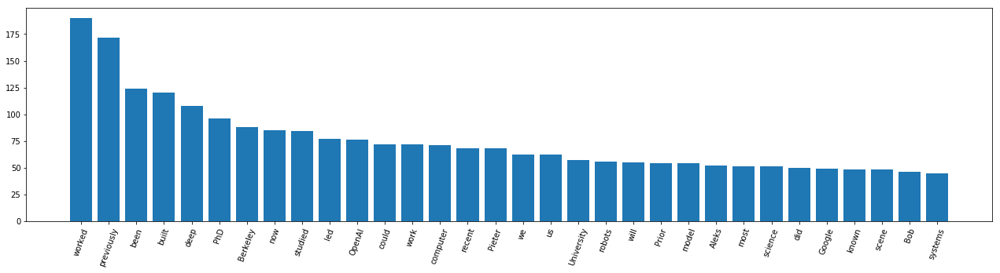

0.14549196868189523 0 13
2d tsne R.S. l2 distance to OpenAI interns/full-time/outgroup = 3.600e+01/6.216e+01/1.647e+01


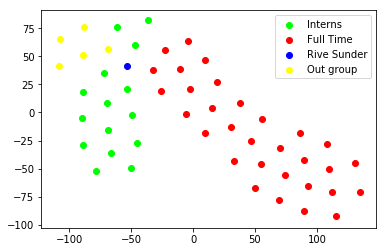

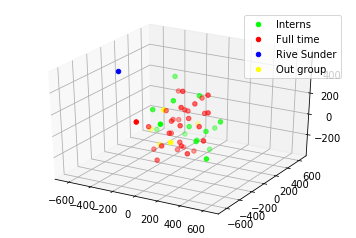

3d tsne R.S. l2 distance to OpenAI interns/full-time/outgroup = 6.417e+02/5.827e+02/6.665e+02
2d tsne R.S. l2 distance to OpenAI interns/full-time/outgroup = 3.982e+01/1.157e+02/2.925e-01


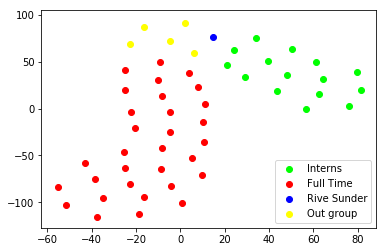

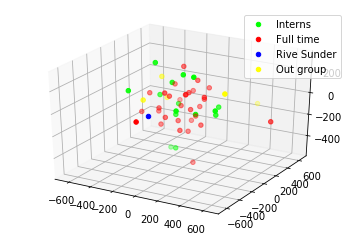

3d tsne R.S. l2 distance to OpenAI interns/full-time/outgroup = 2.731e+02/2.386e+02/3.364e+02
2d tsne R.S. l2 distance to OpenAI interns/full-time/outgroup = 6.594e+01/2.127e+02/3.083e+01


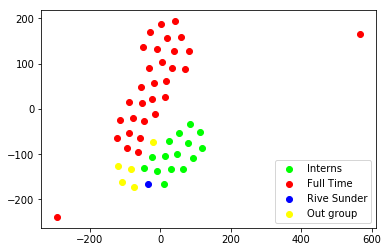

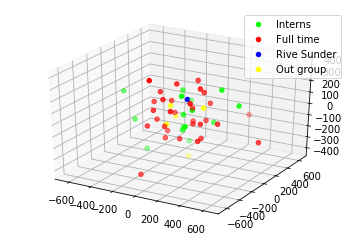

3d tsne R.S. l2 distance to OpenAI interns/full-time/outgroup = 1.266e+02/1.367e+02/1.758e+02


In [22]:
#for entry in openaiInterns:
#    print(entry.split())

internVecs, myBowDict = text_to_BOW(openaiInterns,wordcount)
ftVecs, myBowDict = text_to_BOW(openaiFulltime,wordcount)
myVecs, myBowDict = text_to_BOW(myBios,wordcount)

outVecs, myBowDict = text_to_BOW(outgroup,wordcount)

noInterns = len(internVecs)
noFT = len(ftVecs)
noMyBios = len(myVecs)
allBioVecs = np.append(internVecs,ftVecs,axis=0)
allBioVecs = np.append(allBioVecs,myVecs,axis=0)
allBioVecs = np.append(allBioVecs,outVecs,axis=0)



plt.figure(figsize=(22,5))

mySortOrder = np.argsort(np.sum(ftVecs,axis=0))[::-1]
myTest = np.take(np.sum(ftVecs,axis=0),mySortOrder,0)
print(np.shape(mySortOrder))

myKeys = list(myBowDict.keys())
print(np.shape(myKeys))
myTest2 = np.take(myKeys,mySortOrder,0)

print(np.shape(myTest))
plt.bar(range(len(outVecs[0,0:32])), myTest[0:32], align='center')

plt.xticks(range(len(outVecs[0,0:32])), myTest2,rotation=70)

plt.show()

import sklearn
from sklearn.manifold import TSNE


X = np.copy(allBioVecs)
print(np.mean(X),np.min(X),np.max(X))
if(1):
    #shift to zero mean s.d. = 1
    allBioVecs = allBioVecs - np.mean(allBioVecs)
    allBioVecs = allBioVecs / np.std(allBioVecs)
    
for mySeed in [42, 1337, 0]:
    #mySeed = 42
    myModel2d = TSNE(n_components=2,random_state=mySeed)#,init='pca')
    myModel3d = TSNE(n_components=3,random_state=mySeed)#,init='pca')
    bios2d = myModel2d.fit_transform(allBioVecs)
    bios3d = myModel3d.fit_transform(allBioVecs)



    from mpl_toolkits.mplot3d import Axes3D
    import matplotlib.pyplot as plt


    fig2d = plt.figure()

    ax2d = fig2d.add_subplot(111)
    ax2d.scatter(bios2d[0:noInterns,0],bios2d[0:noInterns,1],color=[0,1,0],label="Interns")
    ax2d.scatter(bios2d[noInterns:noFT+noInterns,0],bios2d[noInterns:noFT+noInterns,1],color=[1,0,0],label="Full Time")
    ax2d.scatter(bios2d[noFT+noInterns:noFT+noInterns+noMyBios,0],bios2d[noFT+noInterns:noFT+noInterns+noMyBios,1],color=[0,0,1],label="Rive Sunder")
    ax2d.scatter(bios2d[noFT+noInterns+noMyBios:len(bios2d),0],bios2d[noFT+noInterns+noMyBios:len(bios2d),1],color=[1,1,0],label="Out group")
    
    #calculate L2 distance from Rive Sunder's bio to various groups' bios
    b2dRS = bios2d[noFT+noInterns:noFT+noInterns+noMyBios,1]
    b2dFTi = np.mean(bios2d[noInterns:noFT+noInterns,1],axis=0)
    b2dInt = np.mean(bios2d[0:noInterns,1], axis = 0)
    b2dOut = np.mean(bios2d[noFT+noInterns+noMyBios:len(bios2d),1],axis=0)
    rsL2 = [np.linalg.norm(b2dRS-b2dInt),np.linalg.norm(b2dRS-b2dFTi),np.linalg.norm(b2dRS-b2dOut)]
    
    
    ax2d.legend()

    axLimits = 700

    fig3d = plt.figure()
    ax3d = fig3d.add_subplot(111, projection='3d')

    ax3d.scatter(bios3d[0:noInterns,0],bios3d[0:noInterns,1],bios3d[0:noInterns,2],color=[0,1,0],label="Interns")
    ax3d.scatter(bios3d[noInterns:noFT+noInterns,0],bios3d[noInterns:noFT+noInterns,1],bios3d[noInterns:noFT+noInterns,2],color=[1,0,0],label="Full time")
    ax3d.scatter(bios3d[noFT+noInterns:noFT+noInterns+noMyBios,0],bios3d[noFT+noInterns:noFT+noInterns+noMyBios,1],bios3d[noFT+noInterns:noFT+noInterns+noMyBios,2],color=[0,0,1],label="Rive Sunder")
    ax3d.scatter(bios3d[noFT+noInterns+noMyBios:len(bios3d),0],bios3d[noFT+noInterns+noMyBios:len(bios3d),1],bios3d[noFT+noInterns+noMyBios:len(bios3d),2],color=[1,1,0],label="Out group")
    ax3d.axis([-axLimits,axLimits,-axLimits,axLimits])
    ax3d.legend()
    plt.show()
    
    #calculate L2 distance from Rive Sunder's bio to various groups' bios
    b3dRS = bios3d[noFT+noInterns:noFT+noInterns+noMyBios,1:3]
    b3dFTi = np.mean(bios3d[noInterns:noFT+noInterns,1:3],axis=0)
    b3dInt = np.mean(bios3d[0:noInterns,1:3], axis = 0)
    b3dOut = np.mean(bios3d[noFT+noInterns+noMyBios:len(bios3d),1],axis=0)
    rsL2 = [np.linalg.norm(b3dRS-b3dInt),np.linalg.norm(b3dRS-b3dFTi),np.linalg.norm(b3dRS-b3dOut)]
    print("2d tsne R.S. l2 distance to OpenAI interns/full-time/outgroup = %.3e/%.3e/%.3e"\
          %(rsL2[0],rsL2[1],rsL2[2]))
    print("3d tsne R.S. l2 distance to OpenAI interns/full-time/outgroup = %.3e/%.3e/%.3e"\
          %(rsL2[0],rsL2[1],rsL2[2]))

In [23]:
# Statistics for bio vectors
X = np.copy(allBioVecs)
print(np.mean(X),np.min(X),np.max(X))

-1.111208774344333e-17 -0.26405293833515003 23.32960813763947


In [80]:
if(0):
    # code used for scraping job descriptions from the web, left here for reference
    # (but no longer needed as job descriptions are saved)
    # job descriptions from openAI
    myAddys = ['https://jobs.lever.co/openai/f5c8d70e-c8a2-4696-82e1-635d106e649c']
    myAddys.append('https://jobs.lever.co/openai/ccb797f6-242d-4d83-9ed3-093db9dff172')
    myAddys.append('https://jobs.lever.co/openai/588c1d80-4632-4d5c-a535-9f2c8c80c501')
    myAddys.append('https://jobs.lever.co/openai/a0d3b158-14a0-48db-b38c-1c94bb18f69b')

    # job descriptions from AI^2
    myAddys.append('https://allenai.org/jobs/job/young-investigators-program-209503.html')
    myAddys.append('https://allenai.org/jobs/job/research-scientist-aristo-897549.html')
    myAddys.append('https://allenai.org/jobs/job/research-scientist-209509.html')
    myAddys.append('https://allenai.org/jobs/job/research-internships-209513.html')

    # job descriptions from deepmind
    myAddys.append('https://deepmind.com/careers/742098/')
    myAddys.append('https://deepmind.com/careers/774516/')
    myAddys.append('https://deepmind.com/careers/879566/')
    myAddys.append('https://deepmind.com/careers/1167158/')

    # out group 
    myAddys.append('http://www.eng.ox.ac.uk/jobs/current-vacancies/vacancy/135565-Postdoctoral-Assistant-in-Scientific-Computing')
    myAddys.append('http://www.eng.ox.ac.uk/jobs/current-vacancies/vacancy/135206-Postdoctoral-Research-Assistant-in-Experimental-Cell-Mechanics')
    myAddys.append('http://www.eng.ox.ac.uk/jobs/current-vacancies/vacancy/135203-Postdoctoral-Research-Assistant-in-Physiological-Modelling')
    myAddys.append('http://www.eng.ox.ac.uk/jobs/current-vacancies/vacancy/135457-Postdoctoral-Research-Assistant-in-Smart-Asthma-Monitoring')


    # Job descriptions from Google Brain
    # Requires javascript to view -- scrape manually
    #myAddys.append('https://careers.google.com/jobs#!t=jo&jid=/google/research-scientist-google-brain-united-345-spear-st-san-francisco-ca-94105-usa-2483770259&')
    #myAddys.append('https://careers.google.com/jobs#!t=jo&jid=/google/research-scientist-google-brain-minato-tokyo-japan-3869100100&')
    #myAddys.append('https://careers.google.com/jobs#!t=jo&jid=/google/research-scientist-google-brain-google-building-110-brandschenkestrasse-3892010117&')
    #myAddys.append('https://careers.google.com/jobs#!t=jo&jid=/google/research-scientist-google-brain-8-rue-de-londres-75009-paris-france-3914040062&')

    # Job descriptions from NNAisense
    myAddys =['https://nnaisense.com/careers.html#ia01']
    myAddys.append('https://nnaisense.com/careers.html#agi01')
    myAddys.append('https://nnaisense.com/careers.html#agi02')
    myAddys.append('https://nnaisense.com/careers.html#agi03')

    # Job descriptions from MIRI
    myAddys.append('https://intelligence.org/careers/research-fellow/')
    myAddys.append('https://intelligence.org/2017/12/12/ml-living-library/')
    myAddys.append('https://intelligence.org/2016/03/18/seeking-research-fellows-in-type-theory-and-machine-self-reference/')
    myAddys.append('https://intelligence.org/careers/software-engineer/')


    # Read in job descriptions with beautiful soup 
    if(1):

        myJDs = []

        myText = ''
        for addy in myAddys:
            print(addy)
            #myURL = urllib.request.urlopen(addy)
            req = urllib.request.Request(url=addy,headers={'User-Agent':' Mozilla/5.0 (Windows NT 6.1; WOW64; rv:12.0) Gecko/20100101 Firefox/12.0'})
            try:
                handler = urllib.request.urlopen(req)
            except HTTPError as e:
                content = e.read()
            myURL = handler #urllib.request.urlopen(myAddy)

            myTest = myURL.read()
            soup = bs(myTest, 'html.parser')
            soupText = soup.get_text()
            myText = myText + soupText
            myJDs.append(soupText)


    # manually clean scraped text

    if(1):
        for ck in range(0,4):
            #clean up google JDs
                start  = 290
                stop = len(myJDs[ck])-0
                #print('\n',(myJDs[ck][start:stop]))
                myJDs[ck] = myJDs[ck][start:stop]

        for ck in range(4,8):
                #clean up JDs
                    start  = 5900
                    stop = len(myJDs[ck])-1295
                    #print('\n',(myJDs[ck][start:stop]))
                    myJDs[ck] = myJDs[ck][start:stop]
    # Manually clean scraped text - bearable for this small dataset but avoid at all costs for larger sets
    #print(len(myJDs[0]))
    if(0):
        print(len(myJDs[0]))
        for ck in range(4):
                print('\n',(myJDs[ck][103306:len(myJDs[ck])-653]))
                myJDs[ck] = myJDs[ck][103306:len(myJDs[ck])-653]
        if(1):
            for ck in range(4):
                print('\n',(myJDs[ck][103306:len(myJDs[ck])-653]))
                myJDs[ck] = myJDs[ck][103306:len(myJDs[ck])-653]
            print(len(myJDs[4]))

            for ck in range(4,8):
                #print('\n',myJDs[ck][2100:len(myJDs[ck])-1150])
                myJDs[ck] = myJDs[ck][2100:len(myJDs[ck])-1150]

            print(len(myJDs[9]))
            for ck in range(8,12):
                #print('\n',myJDs[ck][1970:len(myJDs[ck])-1100])
                myJDs[ck] = myJDs[ck][1970:len(myJDs[ck])-1100]

            print(len(myJDs[12]))
            for ck in range(12,16):
                #print('\n',myJDs[ck][2150:len(myJDs[ck])-850])
                myJDs[ck] = myJDs[ck][2150:len(myJDs[ck])-850]
            #np.save('./data/myJDs.npy',myJDs)
            #np.save('./data/myAddys.npy',myAddys)
            #np.save('./data/myText.npy',myText)
    if(0):
        #else:
        myJDs = np.load('./data/myJDs.npy')
        myAddys = np.load('./data/myAddys.npy')
        myText = np.load('./data/myText.npy')

In [267]:

# Job descriptions from MIRI #ALSO MANUAL SCRAPING!! v_v
#myAddys.append('https://intelligence.org/careers/research-fellow/')
#myAddys.append('https://intelligence.org/2017/12/12/ml-living-library/')
#myAddys.append('https://intelligence.org/2016/03/18/seeking-research-fellows-in-type-theory-and-machine-self-reference/')
#myAddys.append('https://intelligence.org/careers/software-engineer/')

#from openai
myAddys = ['https://jobs.lever.co/openai/f5c8d70e-c8a2-4696-82e1-635d106e649c']
myAddys.append('https://jobs.lever.co/openai/ccb797f6-242d-4d83-9ed3-093db9dff172')
myAddys.append('https://jobs.lever.co/openai/588c1d80-4632-4d5c-a535-9f2c8c80c501')
myAddys.append('https://jobs.lever.co/openai/a0d3b158-14a0-48db-b38c-1c94bb18f69b')

# job descriptions from AI^2
myAddys.append('https://allenai.org/jobs/job/young-investigators-program-209503.html')
myAddys.append('https://allenai.org/jobs/job/research-scientist-aristo-897549.html')
myAddys.append('https://allenai.org/jobs/job/research-scientist-209509.html')
myAddys.append('https://allenai.org/jobs/job/research-internships-209513.html')

# job descriptions from deepmind
myAddys.append('https://deepmind.com/careers/742098/')
myAddys.append('https://deepmind.com/careers/774516/')
myAddys.append('https://deepmind.com/careers/879566/')
myAddys.append('https://deepmind.com/careers/1167158/')

# out group 
myAddys.append('http://www.eng.ox.ac.uk/jobs/current-vacancies/vacancy/135565-Postdoctoral-Assistant-in-Scientific-Computing')
myAddys.append('http://www.eng.ox.ac.uk/jobs/current-vacancies/vacancy/135206-Postdoctoral-Research-Assistant-in-Experimental-Cell-Mechanics')
myAddys.append('http://www.eng.ox.ac.uk/jobs/current-vacancies/vacancy/135203-Postdoctoral-Research-Assistant-in-Physiological-Modelling')
myAddys.append('http://www.eng.ox.ac.uk/jobs/current-vacancies/vacancy/135457-Postdoctoral-Research-Assistant-in-Smart-Asthma-Monitoring')

# Job descriptions from NNAisense
myAddys.append('https://nnaisense.com/careers.html#ia01')
myAddys.append('https://nnaisense.com/careers.html#agi01')
myAddys.append('https://nnaisense.com/careers.html#agi02')
myAddys.append('https://nnaisense.com/careers.html#agi03')


# Read in job descriptions with beautiful soup 
if(1):

    myJDs = []

    myText = ''
    for addy in myAddys:
        print(addy)
        #myURL = urllib.request.urlopen(addy)
        req = urllib.request.Request(url=addy,headers={'User-Agent':' Mozilla/5.0 (Windows NT 6.1; WOW64; rv:12.0) Gecko/20100101 Firefox/12.0'})
        try:
            handler = urllib.request.urlopen(req)
        except HTTPError as e:
            content = e.read()
        myURL = handler #urllib.request.urlopen(myAddy)

        myTest = myURL.read()
        soup = bs(myTest, 'html.parser')
        soupText = soup.get_text()
        myText = myText + soupText
        myJDs.append(soupText)


# manually clean scraped text

if(1):
    for ck in range(4):
        #print('\n',(myJDs[ck][103306:len(myJDs[ck])-653]))
        myJDs[ck] = myJDs[ck][103306:len(myJDs[ck])-653]
    print(len(myJDs[4]))

    for ck in range(4,8):
        #print('\n',myJDs[ck][2100:len(myJDs[ck])-1150])
        myJDs[ck] = myJDs[ck][2100:len(myJDs[ck])-1150]

    print(len(myJDs[9]))
    for ck in range(8,12):
        #print('\n',myJDs[ck][1970:len(myJDs[ck])-1100])
        myJDs[ck] = myJDs[ck][1970:len(myJDs[ck])-1100]

    print(len(myJDs[12]))
    for ck in range(12,16):
        #print('\n',myJDs[ck][2150:len(myJDs[ck])-850])
        myJDs[ck] = myJDs[ck][2150:len(myJDs[ck])-850]
        
    for ck in range(16,20):
        #clean up google JDs
        print(ck)
        start  = 290
        stop = len(myJDs[ck])-0
        #print('\n',(myJDs[ck][start:stop]))
        myJDs[ck] = myJDs[ck][start:stop]

    myJDs.append("""Research Fellow




The position
MIRI’s mission is to ensure that the creation of smarter-than-human intelligence has a positive impact on the world. Our offices are located in downtown Berkeley, two blocks from the UC Berkeley campus.
We’re seeking ambitious, capable technical researchers to solve open problems related to the AI alignment problem. Our current research agenda includes work on topics such as logical uncertainty, decision theory, and corrigibility. Other research topics will be seriously considered if you can make the case for their tractability and their relevance to the design of cleanly designed, robustly and stably beneficial, well-understood AGI systems.
This is not a limited-term position. The ideal candidate has a career interest in these research questions and aims to develop into a senior research fellow at MIRI, or aims to continue these avenues of research at another institution after completing substantial work at MIRI.
 
Some properties you should have

Published research in computer science, logic, or mathematics.
Enough background to understand different parts of our research program and technical work as needed.
A proactive research attitude, and the ability to generate productive new ideas for research directions.

A formal degree in mathematics or computer science is not required, but is recommended.
 
Our recommended path  to becoming a MIRI research fellow
To demonstrate the research ability we’re looking for in candidates, applicants should aim to do one or more of the following things:

Apply to attend one or more MIRI research workshops. Before applying for a fellowship, you’ll need to have attended at least one research workshop.
Attend several meetings of the MIRIx group nearest you.
Study our research thoroughly enough that you can publish interesting new technical contributions on the Intelligent Agent Foundations Forum.

 
Apply to get involved in our research.
 



 


 
 
 
 






Research
Technical Agenda
Research Forum
All Publications



Get Involved
Careers
Donate
MIRIx





About

Team
Privacy & Terms  
Transparency


Blog






Machine Intelligence Research Institute	
								2030 Addison St Fl 7
								Berkeley CA 94704
""")
    
    myJDs.append("""ML Living Library Opening

December 12, 2017  |  Alex Vermeer  |  News
 

The Machine Intelligence Research Institute is looking for a very specialized autodidact to keep us up to date on developments in machine learning—a “living library” of new results.
ML is a fast-moving and diverse field, making it a challenge for any group to stay updated on all the latest and greatest developments. To support our AI alignment research efforts, we want to hire someone to read every interesting-looking paper about AI and machine learning, and keep us abreast of noteworthy developments, including new techniques and insights.
We expect that this will sound like a very fun job to a lot of people! However, this role is important to us, and we need to be appropriately discerning—we do not recommend applying if you do not already have a proven ability in this or neighboring domains.
Our goal is to hire full-time, ideally for someone who would be capable of making a multi-year commitment—we intend to pay you to become an expert on the cutting edge of machine learning, and don’t want to make the human capital investment unless you’re interested in working with us long-term.
 

About the Role
We’d like to fill this position as soon as we find the right candidate. Our hiring process tends to involve a lot of sample tasks and probationary hires, so if you are interested, we encourage you to apply early.
This is a new position for a kind of work that isn’t standard. Although we hope to find someone who can walk in off the street and perform well, we’re also interested in candidates who think they might take three months of training to meet the requirements.
Examples of the kinds of work you’ll do:

Read through archives and journals to get a sense of literally every significant development in the field, past and present.
Track general trends in the ML space—e.g., “Wow, there sure is a lot of progress being made on Dota 2!”—and let us know about them.
Help an engineer figure out why their code isn’t working—e.g., “Oh, you forgot the pooling layer in your convolutional neural network.”
Answer/research MIRI staff questions about ML techniques or the history of the field.
Share important developments proactively; researchers who haven’t read the same papers as you often won’t know the right questions to ask unprompted!

 
The Ideal Candidate
Some qualities of the ideal candidate:

Extensive breadth and depth of machine learning knowledge, including the underlying math.
Familiarity with ideas related to AI alignment.
Delight at the thought of getting paid to Know All The Things.
Programming capability—for example, you’ve replicated some ML papers.
Ability to deeply understand and crisply communicate ideas. Someone who just recites symbols to our team without understanding them isn’t much better than a web scraper.
Enthusiasm about the prospect of working at MIRI and helping advance the field’s understanding of AI alignment.
Residence in (or willingness to move to) the Bay Area. This job requires high-bandwidth communication with the research team, and won’t work as a remote position.
Ability to work independently with minimal supervision, and also to work in team/group settings.


 
Working at MIRI
We strive to make working at MIRI a rewarding experience.

Modern Work Spaces — Many of us have adjustable standing desks with large external monitors. We consider workspace ergonomics important, and try to rig up workstations to be as comfortable as possible. Free snacks, drinks, and meals are also provided at our office.
Flexible Hours — We don’t have strict office hours, and we don’t limit employees’ vacation days. Our goal is to make rapid progress on our research agenda, and we would prefer that staff take a day off rather than extend tasks to fill an extra day.
Living in the Bay Area — MIRI’s office is located in downtown Berkeley, California. From our office, you’re a 30-second walk to the BART (Bay Area Rapid Transit), which can get you around the Bay Area; a 3-minute walk to UC Berkeley campus; and a 30-minute BART ride to downtown San Francisco.

 
EEO & Employment Eligibility
MIRI is an equal opportunity employer. We are committed to making employment decisions based on merit and value. This commitment includes complying with all federal, state, and local laws. We desire to maintain a work environment free of harassment or discrimination due to sex, race, religion, color, creed, national origin, sexual orientation, citizenship, physical or mental disability, marital status, familial status, ethnicity, ancestry, status as a victim of domestic violence, age, or any other status protected by federal, state, or local laws
 
Apply
If interested, click here to apply. For questions or comments, email Matt Graves (matthew.graves@intelligence.org).


 



Tweet



 
 
 

 


Search










Browse

All
Analysis
Conversations
Guest Posts
MIRI Strategy
News
Newsletters
Papers
Video


Subscribe
Join  newsletter subscribers








""")
myJDs.append("""
The Machine Intelligence Research Institute (MIRI) is accepting applications for a full-time research fellow to develop theorem provers with self-referential capabilities, beginning by implementing a strongly typed language within that very language. The goal of this research project will be to help us understand autonomous systems that can prove theorems about systems with similar deductive capabilities. Applicants should have experience programming in functional programming languages, with a preference for languages with dependent types, such as Agda, Coq, or Lean.
MIRI is a mathematics and computer science research institute specializing in long-term AI safety and robustness work. Our offices are in Berkeley, California, near the UC Berkeley campus.

Type Theory in Type Theory
Our goal with this project is to build tools for better modeling reflective reasoning in software systems, as with our project modeling the HOL4 proof assistant within itself. There are Gödelian reasons to think that self-referential reasoning is not possible in full generality. However, many real-world tasks that cannot be solved in full generality admit of effective mostly-general or heuristic approaches. Humans, for example, certainly succeed in trusting their own reasoning in many contexts.
There are a number of tools missing in modern-day theorem provers that would be helpful for studying self-referential reasoning. First among these is theorem provers that can construct proofs about software systems that make use of a very similar theorem prover. To build these tools in a strongly typed programming language, we need to start by writing programs and proofs that can make reference to the type of programs and proofs in the same language.
Type theory in type theory has recently received a fair amount of attention. James Chapman’s work is pushing in a similar direction to what we want, as is Matt Brown and Jens Palsberg’s, but these projects don’t yet give us the tools we need. (F-omega is too weak a logic for our purposes, and methods like Chapman’s don’t get us self-representations.)
This is intended to be an independent research project, though some collaborations with other researchers may occur. Our expectation is that this will be a multi-year project, but it is difficult to predict exactly how difficult this task is in advance. It may be easier than it looks, or substantially more difficult.
Depending on how the project goes, researchers interested in continuing to work with us after this project’s completion may be able to collaborate on other parts of our research agenda or propose their own additions to our program.
Working at MIRI
We try to make working at MIRI a great experience. Here’s how we operate:

Modern Work Spaces. Many of us have adjustable standing desks with large external monitors. We consider workspace ergonomics important, and try to rig up work stations to be as comfortable as possible. Free snacks, drinks, and meals are also provided at our office.
Flexible Hours. This is a salaried position. We don’t have strict office hours, and we don’t limit employees’ vacation days. Our goal is to make quick progress on our research agenda, and we would prefer that researchers take a day off than that they extend tasks to fill an extra day.
Living in the Bay Area. MIRI’s office is located in downtown Berkeley, California. From our office, you’re a 30-second walk to the BART (Bay Area Rapid Transit), which can get you around the Bay Area; a 3-minute walk to UC Berkeley campus; and a 30-minute BART ride to downtown San Francisco.
Travel Assistance. Visa assistance is available if needed. If you are moving to the Bay Area, we’ll cover up to $3,500 in moving expenses. We also provide a public transit pass with a large monthly allowance.

The salary for this position is negotiable, and comes with top-notch health and dental benefits.
About MIRI
MIRI is a Berkeley-based research nonprofit studying foundational questions in artificial intelligence. Our goal is to ensure that high-quality decision-making systems have a positive global impact in coming decades. MIRI Research Advisor and AI pioneer Stuart Russell outlines several causes for concerns about high-capability AI software:


The utility function may not be perfectly aligned with the values of the human race, which are (at best) very difficult to pin down.
Any sufficiently capable intelligent system will prefer to ensure its own continued existence and to acquire physical and computational resources – not for their own sake, but to succeed in its assigned task.

A system that is optimizing a function of n variables, where the objective depends on a subset of size k<n, will often set the remaining unconstrained variables to extreme values; if one of those unconstrained variables is actually something we care about, the solution found may be highly undesirable.
Our focus is on systems too complex and autonomous for software developers to anticipate all possible states the system and its environment might evolve into. To employ such systems safely, software engineers will need to understand their behavior on a deep level, and be able to use machine analysis and verification techniques to confirm high-level system properties.
MIRI is the primary organization specializing in this line of technical research. Our work is cited in the Research Priorities for Robust and Beneficial Artificial Intelligence report, and has been discussed in Nick Bostrom’s Superintelligence and Russell and Norvig’s Artificial Intelligence: A Modern Approach.
Long-term AI safety is a rapidly growing field of research that has recently received significant public attention. Our current research is intended to provide this new field with theoretical foundations that will help guide the direction of future research.
How to Apply
Click here to apply.


 



Tweet



 
 
 

 


Search










Browse

All
Analysis
Conversations
Guest Posts
MIRI Strategy
News
Newsletters
Papers
Video


Subscribe
Join  newsletter subscribers





""")

myJDs.append("""Software Engineer




The Machine Intelligence Research Institute is looking for highly capable software engineers to directly contribute to our work on the AI alignment problem, with a focus on projects related to machine learning. We’re seeking engineers with extremely strong programming skills who are passionate about MIRI’s mission and looking for challenging and intellectually engaging work.
 
About the Role
In this role you will work closely with our research team to: create and run novel coding experiments and projects; build development infrastructure; and rapidly prototype, implement, and test AI alignment ideas related to machine learning. 
 
The Ideal Candidate
Some qualities of the ideal candidate:

Comfortable programming in different languages and frameworks.
Has mastery in at least one technically demanding area.
Machine learning experience is not a requirement, though it is a plus.
Able to work with mathematicians on turning mathematical concepts into elegant code in a variety of environments and languages. 
Able to work independently with minimal supervision, and in team/group settings. 
Highly familiar with basic ideas related to AI alignment.
Residence in (or willingness to move to) the Bay Area. This job requires working directly with our research team, and won’t work as a remote position.
Enthusiasm about the prospect of working at MIRI and helping advance the field of AI alignment research.

 
Working at MIRI
We strive to make working at MIRI a rewarding experience:

Modern Work Spaces — Many of us have adjustable standing desks with large external monitors. We consider workspace ergonomics important, and try to rig up workstations to be as comfortable as possible. Free snacks, drinks, and meals are also provided at our office.
Flexible Hours — We don’t have strict office hours, and we don’t limit employees’ vacation days. Our goal is to make rapid progress on our research agenda, and we would prefer that staff take a day off than that they extend tasks to fill an extra day.
Living in the Bay Area — MIRI’s office is located in downtown Berkeley, California. From our office, you’re a 30-second walk to the BART (Bay Area Rapid Transit), which can get you around the Bay Area; a 3-minute walk to UC Berkeley campus; and a 30-minute BART ride to downtown San Francisco.

 
EEO & Employment Eligibility
MIRI is an equal opportunity employer. We are committed to making employment decisions based on merit and value. This commitment includes complying with all federal, state, and local laws. We desire to maintain a work environment free of harassment or discrimination due to sex, race, religion, color, creed, national origin, sexual orientation, citizenship, physical or mental disability, marital status, familial status, ethnicity, ancestry, status as a victim of domestic violence, age, or any other status protected by federal, state, or local laws.
 
Apply
Our hiring process tends to involve a lot of sample tasks and probationary-hires, so we encourage you to apply sooner than later. 
Click here to apply.
For questions or comments, email engineering@intelligence""")

https://jobs.lever.co/openai/f5c8d70e-c8a2-4696-82e1-635d106e649c
https://jobs.lever.co/openai/ccb797f6-242d-4d83-9ed3-093db9dff172
https://jobs.lever.co/openai/588c1d80-4632-4d5c-a535-9f2c8c80c501
https://jobs.lever.co/openai/a0d3b158-14a0-48db-b38c-1c94bb18f69b
https://allenai.org/jobs/job/young-investigators-program-209503.html
https://allenai.org/jobs/job/research-scientist-aristo-897549.html
https://allenai.org/jobs/job/research-scientist-209509.html
https://allenai.org/jobs/job/research-internships-209513.html
https://deepmind.com/careers/742098/
https://deepmind.com/careers/774516/
https://deepmind.com/careers/879566/
https://deepmind.com/careers/1167158/
http://www.eng.ox.ac.uk/jobs/current-vacancies/vacancy/135565-Postdoctoral-Assistant-in-Scientific-Computing
http://www.eng.ox.ac.uk/jobs/current-vacancies/vacancy/135206-Postdoctoral-Research-Assistant-in-Experimental-Cell-Mechanics
http://www.eng.ox.ac.uk/jobs/current-vacancies/vacancy/135203-Postdoctoral-Research-Assistant-i

In [268]:
myJDs.append("""About this position
Our long term goal is to build machines that exceed human intelligence. We are passionate about changing the world with science and software, and we are looking for exceptional people to join us in that mission. Vicarious is working on solving the problems that will take us from the current state of the art to human-level AGI. We work on all components of the AI problem, including perception, concept learning, reasoning, and sensory motor systems, and beyond. Our underlying framework is a probabilistic graphical model that is inspired by the structure of the neocortex. You will join a small, tightly knit collective of extraordinary engineer scientists. Everyone works on our full stack, from algorithms to low level optimizations to GUI code and back.
As part of our team, you will…

    put your algorithm and math skills to work in solving the hardest problems in learning and inference in hierarchical models.
    make decisions about how to translate complex ideas to working solutions while keeping a keen eye for computation/accuracy/memory tradeoffs.
    design controlled experiments to show particular performance aspects of the systems and large scale experiments to show statistical robustness.
    write infrastructure software to scale our systems and data visualization routines to understand what is happening inside.
    document your inventions for patents and publications.
    keep yourself updated with advances in the field of machine learning and neuroscience.
    The craftsmanship of building elegant algorithms and tight implementations are part of our company DNA. We work hard to maintain a codebase and a culture that are a joy to work in.

Desired skills and experience

    Preferred PhD or Masters in CS/EE or a related discipline or Masters in CS/EE with relevant research experience. We also consider exceptional applicants with other backgrounds.
    Experience building hierarchical vision systems and publishing relevant papers in CVPR/NIPS/ICML is a big plus.
    Extensive programming skills, ideally in Python and C, and a track record of translating ideas into prototypes quickly.
    Solid fundamentals in linear algebra, probability theory, signal processing, and optimization.
    Experience developing and testing ideas in a large scale setting.
    Experience with belief propagation and approximation methods.
    Knowledge of biologically inspired models of vision.
    Interest in neuroscience a plus.
    Experience working in an interpreted environment like MATLAB or Mathematica also a plus.

Desired personal qualities

    Integrity
    Altruism
    Intellectual breadth
    Interest in reviewing literature and implementing ideas in areas outside comfort zone
    Ability to admit when wrong
    Ability to work in a diverse team
    Sense of humor

Benefits

    Work on the most important problems in the field with a team who will challenge and support you.
    We have flexible hours and a family-friendly culture. Building the first intelligent machines is our life’s work, and we emphasize sustainability over crunch. Our board member and investor Dustin Moskovitz recently wrote an article that captures how we relate to our work.
    Health, dental, and vision insurance, as well as short and long term disability. We pay 100% of employee premiums and 50% of dependent premiums.
    Flexible paid parental leave.
    Healthy, organic breakfast and lunch every day.
    Company wireless plan. Never pay a mobile phone bill again.
    Get to work easily! Our office is 60 seconds from BART and public transportation, and adjacent to a beautiful park. If you use BART to get to work, we subsidize the cost of tickets.
    We have fun workday activities like soccer, volleyball, board games, or journal club.
    Certified personal trainer who will design an exercise program that suits your fitness level and help you meet your goals.
    Executive and one-on-one coaching for everyone. Select between different coaches, depending on what types of skills you want to develop.
    Once a year, we take the entire company (including +1s and kids) on a vacation. Yes, it’s as awesome as it sounds.
    We are standing with Fauna and other startups in offering a new policy for civic engagement.
""")

myJDs.append("""
        Research
        Full-time

About this position
Vicarious aims to transform robotics by creating robots with human-level performance on real-world manipulation tasks. We are passionate about changing the world with science and software, and we are looking for exceptional people to join us in that mission. Here you will join a small, tightly knit collective of engineer scientists committed to solving long-term problems.  Our focus is the systematic integration of perception, concept learning, reasoning, and motor control, used to build robotic manipulation systems. As a member of the robotics group at Vicarious, you will play a critical role in our efforts to use our technology to push the state of the art on robotic manipulation.
This will include

    Understanding the algorithms we’ve developed on the vision/learning side and bringing your experience and intuitions to bear on how best to apply them to manipulation tasks.
    Solving the computer vision-specific research and engineering problems that arise, in areas such as object class detection, pose estimation, visual tracking, 3D scene understanding, and 3D reconstruction.
    Developing and maintaining the software stack on the robotic platform.
    Building integrated solutions that apply our technology towards specific product verticals.

Desired skills and experience

    Masters or Ph.D. in a computer vision-related discipline (or equivalent professional experience), preferably in one of the following areas:
        object class and instance detection, pose estimation, and visual tracking
        fine-grained image categorization
        3D scene understanding and recognition from RGB-D imagery
        3D reconstruction, structure-from-motion, or multi-view stereo
    Strong publication record and/or industry experience in the above-mentioned areas.
    Interest/background in algorithms with human-like abilities such as learning from small amounts of data and tight sensorimotor feedback.
    Strong C++ and/or Python skills. Experience developing with OpenCV, TensorFlow, and PCL.

Desired personal qualities

    Integrity
    Ability to admit when wrong
    Altruism
    Fearlessness working outside your comfort zone
    Patience with others
    Described by others as the best researcher / engineer / thinker they know
    Intellectual breadth
    Sense of humor

Benefits

    Work on the most important problems in the field with a team who will challenge and support you.
    We have flexible hours and a family-friendly culture. Building the first intelligent machines is our life’s work, and we emphasize sustainability over crunch. Our board member and investor Dustin Moskovitz recently wrote an article that captures how we relate to our work.
    Health, dental, and vision insurance, as well as short and long term disability. We pay 100% of employee premiums and 50% of dependent premiums.
    Flexible paid parental leave.
    Healthy, organic breakfast and lunch every day.
    Company wireless plan. Never pay a mobile phone bill again.
    Get to work easily! Our office is 60 seconds from BART and public transportation, and adjacent to a beautiful park. If you use BART to get to work, we subsidize the cost of tickets.
    We have fun workday activities like soccer, volleyball, board games, or journal club.
    Certified personal trainer who will design an exercise program that suits your fitness level and help you meet your goals.
    Executive and one-on-one coaching for everyone. Select between different coaches, depending on what types of skills you want to develop.
    Once a year, we take the entire company (including +1s and kids) on a vacation. Yes, it’s as awesome as it sounds.
    We are standing with Fauna and other startups in offering a new policy for civic engagement.
""")

myJDs.append("""
        Engineering
        Full-time

About this position
Our goal is to build a system that achieves human-level intelligence in the domains of vision, language and motor control. We are currently focused on visual perception problems such as recognition, segmentation and scene parsing. We are not building neural networks. You can learn more about our strategy here.
As a research engineer at Vicarious you will quickly come up to speed on recent advancements in machine learning, image processing and computer vision. You will apply this knowledge to improve the computational performance and accuracy of learning and inference algorithms used for vision tasks in a large variety of training environments. Working with other members of the team you will be driving a dense Python and C++ codebase that is pushing the state-of-the-art in AI forward.
As part of our team, you will…

    Develop and refine demonstrations of new research.
    Optimize and scale implementations of researched algorithms.
    Follow lead of Researchers and assist with development.
    Refine the output of the research department into reusable pieces where appropriate.

Desired Skills and Experience

    Preferred Masters or BS in CS/EE or a related discipline. We also consider exceptional applicants with other backgrounds.
    Extensive programming skills, ideally in Python and C, and a track record of translating ideas into prototypes quickly.
    Solid fundamentals in algorithms, math, and probability theory.
    Experience developing and testing ideas in a large scale setting.
    Experience with belief propagation and approximation methods.
    Experience with OpenGL a plus.

Desired Personal Qualities

    Integrity
    Altruism
    Intellectual breadth
    Interest in reviewing literature and implementing ideas in areas outside comfort zone
    Ability to admit when wrong
    Ability to work in a diverse team
    Sense of humor

Benefits

    Work on the most important problems in the field with a team who will challenge and support you.
    We have flexible hours and a family-friendly culture. Building the first intelligent machines is our life’s work, and we emphasize sustainability over crunch. Our board member and investor Dustin Moskovitz recently wrote an article that captures how we relate to our work.
    Health, dental, and vision insurance, as well as short and long term disability. We pay 100% of employee premiums and 50% of dependent premiums.
    Flexible paid parental leave.
    Healthy, organic breakfast and lunch every day.
    Company wireless plan. Never pay a mobile phone bill again.
    Get to work easily! Our office is 60 seconds from BART and public transportation, and adjacent to a beautiful park. If you use BART to get to work, we subsidize the cost of tickets.
    We have fun workday activities like soccer, volleyball, board games, or journal club.
    Certified personal trainer who will design an exercise program that suits your fitness level and help you meet your goals.
    Executive and one-on-one coaching for everyone. Select between different coaches, depending on what types of skills you want to develop.
    Once a year, we take the entire company (including +1s and kids) on a vacation. Yes, it’s as awesome as it sounds.
    We are standing with Fauna and other startups in offering a new policy for civic engagement.
""")

myJDs.append("""
        Research
        Full-Time
        San Francisco Bay Area

About this position

Vicarious aims to transform robotics by creating robots with human level performance on real-world manipulation tasks. We are passionate about changing the world with science and software, and we are looking for exceptional people to join us in that mission. Here you will join a small, tightly knit collective of engineer scientists committed to solving long-term problems. Our focus is the systematic integration of perception, concept learning, reasoning, and motor control, used to build robotic manipulation systems. As a member of the robotics group at Vicarious, you will play a critical role in our efforts to use our technology to push the state of the art on robotic manipulation.
As part of our team, you will…

    Understand the algorithms we’ve developed on the vision/learning side and bring your experience and intuitions to bear on how to best apply them to manipulation tasks.
    Solve the robotics-specific research and engineering problems that arise, in areas such as grasp planning, manipulation, motion planning, control, haptic sensing, and reinforcement learning.
    Develop and maintain the software stack on the robotics platform.
    Build integrated solutions that apply our technology toward specific product verticals.

Desired skills and experience

    Masters or PhD in a robotics-related discipline
    Strong publication record and/or experience in grasping, manipulation, haptic sensing, and motion planning/control.
    Experience getting robots to go, especially those with arms, and deploying them in the real world.
    Interest/background in algorithms with human-like abilities such as learning from small amounts of data and tight sensorimotor feedback.
    Strong C++ and/or Python skills.
    Experience developing with ROS and related software such as Movelt! and PCL.
    Experience with simulation platforms such as Gazebo, Mujoco, and OpenRave.

Desired personal qualities

    Integrity
    Ability to admit when wrong
    Altruism
    Fearlessness working outside your comfort zone
    Patience with others
    Described by others as the best researcher/engineer/thinker they know
    Intellectual breadth
    Sense of humor

Benefits

    Work on the most important problems in the field with a team who will challenge and support you.
    We have flexible hours and a family-friendly culture. Building the first intelligent machines is our life’s work, and we emphasize sustainability over crunch. Our board member and investor Dustin Moskovitz recently wrote an article that captures how we relate to our work.
    Health, dental, and vision insurance, as well as short and long term disability. We pay 100% of employee premiums and 50% of dependent premiums.
    Flexible paid parental leave.
    Healthy, organic breakfast and lunch every day.
    Company wireless plan. Never pay a mobile phone bill again.
    Get to work easily! Our office is 60 seconds from BART and public transportation, and adjacent to a beautiful park. If you use BART to get to work, we subsidize the cost of tickets.
    We have fun workday activities like soccer, volleyball, board games, or journal club.
    Certified personal trainer who will design an exercise program that suits your fitness level and help you meet your goals.
    Executive and one-on-one coaching for everyone. Select between different coaches, depending on what types of skills you want to develop.
    Once a year, we take the entire company (including +1s and kids) on a vacation. Yes, it’s as awesome as it sounds.
    We are standing with Fauna and other startups in offering a new policy for civic engagement.
""")

# Google brain JDs also require javascript, not scrapeable with soup

myJDs.append("""
Research Scientist, Google Brain
Google
Software Engineering
Paris, France
Apply

We do research differently here at Google. Our team of Research Scientists aren't cloistered in a secret lab but are embedded throughout the engineering organization, allowing them to setup large-scale tests and deploy promising ideas quickly and broadly. Ideas may come from internal projects as well as from collaborations with research programs at partner universities and technical institutes all over the world. From creating experiments and prototyping implementations to designing new architectures, Research Scientists work on real-world problems including artificial intelligence, data mining, natural language processing, hardware and software performance analysis, improving compilers for mobile platforms, as well as core search and much more. But you stay connected to your research roots as an active contributor to the wider research community by partnering with universities and publishing papers.

Research Scientists at Google work closely with Software Engineers to discover, invent, and build at the largest scale. Ideas may come from internal projects as well as from collaborations with researchers at partner universities and technical institutes all over the world. From creating experiments and prototyping implementations to designing new learning algorithms, Research Scientists work on challenges in machine perception, data mining, machine learning, and natural language understanding. As a Google Research Scientist, you will continue to be an active contributor to the wider research community by collaborating with academic researchers and by publishing papers.

Researchers on the Google Brain team have the freedom to set their research agenda and to engage as much or as little as they wish with existing products, choosing between doing more basic, methodological research or more applied research as necessary to produce the most compelling results. Because many of the advances we develop today may take years to become useful, the team as a whole maintains a portfolio of projects across this spectrum. It is our philosophy that making substantive progress on hard applications can help drive and sharpen the research questions we study, and in turn scientific breakthroughs can spawn entirely new applications.

The Google Brain team’s research focuses on methods that can learn multiple layers of rich, non-linear feature extractors and can scale to large amounts of data. Much of our work is best understood as part of the deep learning subfield of machine learning, but we are interested in any methods capable of efficient and effective feature learning that get good results on challenging problems. We have resources and access to projects impossible to find elsewhere. Our broad and fundamental research goals allow us to collaborate closely with and–contribute uniquely to–many different product teams across the company.

There is always more information out there, and the Research and Machine Intelligence team has a never-ending quest to find it and make it accessible. We're constantly refining our signature search engine to provide better results, and developing offerings like Google Instant, Google Voice Search and Google Image Search to make it faster and more engaging. We're providing users around the world with great search results every day, but at Google, great just isn't good enough. We're just getting started.
Responsibilities

    Participate in cutting edge research in machine intelligence and machine learning applications.
    Develop solutions for real world, large scale problems.

Qualifications
Minimum qualifications:

    PhD in Computer Science, related technical field or equivalent practical experience.
    Experience in Natural Language Understanding, Computer Vision, Machine Learning, Algorithmic Foundations of Optimization, Data Mining or Machine Intelligence (Artificial Intelligence).
    Experience contributing to research communities and/or efforts, including publishing papers at conferences (such as NIPS, ICML, ACL, CVPR, etc).
    Programming experience in one or more of the following: C, C++, Python.


Preferred qualifications:

    Relevant work experience, including full time industry experience or as a researcher in a lab.
    Strong publication record.
    Ability to design and execute on research agenda.
""")

myJDs.append("""
Research Scientist, Google Brain
Google
Software Engineering
Zürich, Switzerland
Apply

We do research differently here at Google. Our team of Research Scientists aren't cloistered in a secret lab but are embedded throughout the engineering organization, allowing them to setup large-scale tests and deploy promising ideas quickly and broadly. Ideas may come from internal projects as well as from collaborations with research programs at partner universities and technical institutes all over the world. From creating experiments and prototyping implementations to designing new architectures, Research Scientists work on real-world problems including artificial intelligence, data mining, natural language processing, hardware and software performance analysis, improving compilers for mobile platforms, as well as core search and much more. But you stay connected to your research roots as an active contributor to the wider research community by partnering with universities and publishing papers.

Research Scientists at Google work closely with Software Engineers to discover, invent, and build at the largest scale. Ideas may come from internal projects as well as from collaborations with researchers at partner universities and technical institutes all over the world. From creating experiments and prototyping implementations to designing new learning algorithms, Research Scientists work on challenges in machine perception, data mining, machine learning, and natural language understanding. As a Google Research Scientist, you will continue to be an active contributor to the wider research community by collaborating with academic researchers and by publishing papers.

Researchers on the Google Brain team have the freedom to set their research agenda and to engage as much or as little as they wish with existing products, choosing between doing more basic, methodological research or more applied research as necessary to produce the most compelling results. Because many of the advances we develop today may take years to become useful, the team as a whole maintains a portfolio of projects across this spectrum. It is our philosophy that making substantive progress on hard applications can help drive and sharpen the research questions we study, and in turn scientific breakthroughs can spawn entirely new applications.

The Google Brain team’s research focuses on methods that can learn multiple layers of rich, non-linear feature extractors and can scale to large amounts of data. Much of our work is best understood as part of the deep learning subfield of machine learning, but we are interested in any methods capable of efficient and effective feature learning that get good results on challenging problems. We have resources and access to projects impossible to find elsewhere. Our broad and fundamental research goals allow us to collaborate closely with and–contribute uniquely to–many different product teams across the company.

There is always more information out there, and the Research and Machine Intelligence team has a never-ending quest to find it and make it accessible. We're constantly refining our signature search engine to provide better results, and developing offerings like Google Instant, Google Voice Search and Google Image Search to make it faster and more engaging. We're providing users around the world with great search results every day, but at Google, great just isn't good enough. We're just getting started.
Responsibilities

    Participate in cutting edge research in machine intelligence and machine learning applications.
    Develop solutions for real world, large scale problems.

Qualifications
Minimum qualifications:

    PhD degree in Computer Science, related technical field or equivalent practical experience.
    Experience in Natural Language Understanding, Computer Vision, Machine Learning, Algorithmic Foundations of Optimization, Data Mining or Machine Intelligence (Artificial Intelligence).
    Experience contributing to research communities and/or efforts, including publishing papers at conferences (such as NIPS, ICML, ACL, CVPR, etc).
    Programming experience and proficiency in one or more of the following: C, C++, Python.


Preferred qualifications:

    Relevant work experience, including full time industry experience or as a researcher in a lab.
    Strong publication record.
    Ability to design and execute on research agenda.
""")

myJDs.append("""
Research Scientist, Google Brain
Google
Software Engineering
Tokyo, Japan
Apply

We do research differently here at Google. Our team of Research Scientists aren't cloistered in a secret lab but are embedded throughout the engineering organization, allowing them to setup large-scale tests and deploy promising ideas quickly and broadly. Ideas may come from internal projects as well as from collaborations with research programs at partner universities and technical institutes all over the world. From creating experiments and prototyping implementations to designing new architectures, Research Scientists work on real-world problems including artificial intelligence, data mining, natural language processing, hardware and software performance analysis, improving compilers for mobile platforms, as well as core search and much more. But you stay connected to your research roots as an active contributor to the wider research community by partnering with universities and publishing papers.

Research Scientists at Google work closely with Software Engineers to discover, invent, and build at the largest scale. Ideas may come from internal projects as well as from collaborations with researchers at partner universities and technical institutes all over the world. From creating experiments and prototyping implementations, to designing new learning algorithms, Research Scientists work on challenges in machine perception, data mining, machine learning, and natural language understanding. As a Google Research Scientist, you'll continue to be an active contributor to the wider research community by collaborating with academic researchers and by publishing papers, open source projects, or web articles to communicate research findings.

Researchers on the Google Brain team have the freedom to set their research agenda and to engage as much or as little as they wish with existing products, choosing between doing more basic, methodological research or more applied research as necessary to produce the most compelling results. Because many of the advances we develop today may take years to become useful, the team as a whole maintains a portfolio of projects across this spectrum. It is our philosophy that making substantive progress on hard applications can help drive and sharpen the research questions we study, and in turn scientific breakthroughs can spawn entirely new applications.

The Google Brain team’s research focuses on methods that can learn multiple layers of rich, non-linear feature extractors and can scale to large amounts of data. Much of our work is best understood as part of the deep learning subfield of machine learning, but we are interested in any methods, such as evolutionary computing, novelty search, or reinforcement learning, that are also capable of getting good results on challenging problems. We have resources and access to projects impossible to find elsewhere. Our broad and fundamental research goals allow us to collaborate closely with and–contribute uniquely to–many different product teams across the company.

There is always more information out there, and the Research and Machine Intelligence team has a never-ending quest to find it and make it accessible. We're constantly refining our signature search engine to provide better results, and developing offerings like Google Instant, Google Voice Search and Google Image Search to make it faster and more engaging. We're providing users around the world with great search results every day, but at Google, great just isn't good enough. We're just getting started.
Responsibilities

    Participate in cutting edge research in machine intelligence and machine learning applications.
    Develop solutions for real world, large scale problems.

Qualifications
Minimum qualifications:

    PhD in Computer Science, related technical field or equivalent practical experience.
    Experience contributing to research communities and/or efforts, including publishing papers in Machine Learning venues (e.g: JMLR, ICLR, NIPS, ICML, ACL and CVPR).
    Experience in Natural Language Understanding, Computer Vision, Machine Learning, Algorithmic Foundations of Optimization, Data Mining or Machine Intelligence (Artificial Intelligence).
    Programming experience in one or more of the following: C, C++ and/or Python.


Preferred qualifications:

    Relevant work experience, including industry experience or as a Researcher in a lab.
    A solid history of contributions to open source projects that are related to machine learning research. Publication of interesting blog articles related to machine learning.
    Demonstrated publication record.
    Ability to design and execute on research agenda.
""")

myJDs.append("""
Research Scientist, Google Brain (United States)
Google
Software Engineering
San Francisco, CA, United States
Apply

Note: Although most of our Research Scientists are based in Mountain View, CA, we have Research Scientist roles available in other offices as well.

Please indicate your location(s) of interest in your cover letter. This role is also available in Montreal, QC, Canada and Toronto, ON, Canada.


Note: By applying to this position your application is automatically submitted to the following locations: Cambridge, MA, USA; San Francisco, CA, USA; New York, NY, USA; Mountain View, CA, USA

Research Scientists at Google work closely with Software Engineers to discover, invent, and build at the largest scale. Ideas may come from internal projects as well as from collaborations with researchers at partner universities and technical institutes all over the world. From creating experiments and prototyping implementations to designing new learning algorithms, Research Scientists work on challenges in machine perception, data mining, machine learning, and natural language understanding. As a Google Research Scientist, you will continue to be an active contributor to the wider research community by collaborating with academic researchers and by publishing papers.

Researchers on the Google Brain team have the freedom to set their research agenda and to engage as much or as little as they wish with existing products, choosing between doing more basic, methodological research or more applied research as necessary to produce the most compelling results. Because many of the advances we develop today may take years to become useful, the team as a whole maintains a portfolio of projects across this spectrum. It is our philosophy that making substantive progress on hard applications can help drive and sharpen the research questions we study, and in turn scientific breakthroughs can spawn entirely new applications.

The Google Brain team’s research focuses on methods that can learn multiple layers of rich, non-linear feature extractors and can scale to large amounts of data. Much of our work is best understood as part of the deep learning subfield of machine learning, but we are interested in any methods capable of efficient and effective feature learning that get good results on challenging problems. We have resources and access to projects impossible to find elsewhere. Our broad and fundamental research goals allow us to collaborate closely with and–contribute uniquely to–many different product teams across the company.
Responsibilities

    Participate in cutting edge research in machine intelligence and machine learning applications.
    Develop solutions for real world, large scale problems.

Qualifications
Minimum qualifications:

    PhD in Computer Science, related technical field or equivalent practical experience.
    Experience in Natural Language Understanding, Computer Vision, Machine Learning, Algorithmic Foundations of Optimization, Data Mining or Machine Intelligence (Artificial Intelligence)
    Programming experience in one or more of the following: C, C++, Python
    Contributions to research communities and/or efforts, including publishing papers in machine learning venues (e.g: JMLR, ICLR, NIPS, ICML, ACL and CVPR)


Preferred qualifications:

    Relevant work experience, including full time industry experience or as a researcher in a lab
    Strong publication record
    Ability to design and execute on research agenda.
""")


In [269]:
print(len(myJDs))
np.save('./data/myJDs.npy',myJDs)

myText = ''
for myJD in myJDs:
    myText += myJD
    #print(myJD)
np.save('./data/myText.npy',myText)

32


In [316]:
myJDs = np.load('./data/myJDs.npy')

In [319]:
# convert bios to BOWs
wordcount = {}
weirdChar = [',','.','?','!','[','{',']','}',':',';','%','/','/','+','=']

#clean words of punctuation

for JD in myJDs:
    for word in JD.split():
        doAdd = 1


        if word not in wordcount:
            wordcount[word] = 1
        else:
            wordcount[word] += 1
                
print("The dictionary for short bios is %i words long (before cleaning)"%len(wordcount))
        
def text_to_BOW(text,wordcount):
    """Generate Bag-of-Words vector for text list based on available words in wordcount"""
    weirdChar = [',','.','?','!','[','{',']','}',':',';','%','/','/','+','=',\
                "by","which","with","and", "a", "in", "is", "to", "of", "on", "the", "at", "has", "from", "for", "an","In",]

    # build wordcounting dictionary            
    bowDict = {}
    for word in wordcount:
        newWord = word
        for wChar in weirdChar:
            newWord = newWord.replace(wChar,"")
        bowDict[newWord] = 0  
    
    # count word frequency
    myBOWVec = np.array([[0],[0]])
    for entry in text:
        myTemp = bowDict
        for word in entry.split():
            if word in myTemp:
                #print(word)
                myTemp[word] += 1
                
        X = np.array([[1]])

        for k,v in myTemp.items():
            #print(k,v)
            X = np.append(X,[[v]],1)
        X = X[:,1:(X.shape[1])]
        if (len((myBOWVec[0])) > 1):
            myBOWVec = (np.append(myBOWVec,X,0))
        else: 
            #init first entry if output vector is None
            myBOWVec = X
    return myBOWVec, bowDict

The dictionary for short bios is 3073 words long (before cleaning)


In [345]:
X0,bowDict = text_to_BOW(myJDs,wordcount)
X0 = X0.T

In [312]:
# Create a dictionary bag-of-words for the combined job descriptions
wordcount = {}
weirdChar = ['[','{',']','}',':',';','%','/','/','.filename','-','+','=','!,"@','#','$','^','&','*']

for word in myText.split():
    # Check for weird character
    dontAdd = 1
    for wChar in weirdChar:
        if(word.find(wChar) != -1):
            wordcount = wordcount
            dontAdd = 0
            #print('weird character detected')
    # Add word to wordcount dictionary if it seems to be a real weird. 
    if (dontAdd):
        if word not in wordcount:
            wordcount[word] = 1
        else:
            wordcount[word] += 1


if(0):
    for k, v in wordcount.items():
        print(k,v)

# Build bag-of-words Dictionary based on the combined job descriptions
bowDictJD = {}
for word in wordcount:
    bowDictJD[word] = 0  
    
print("Bag of words dictionary uses %i words"%len(wordcount))

Bag of words dictionary uses 2813 words


In [344]:
#Convert the job descriptions to BOW vectors
import copy
#myTemp = wordcount #bowDictJD
X = np.array([[]])
X0 = np.array([[0],[0]])

if(1):
    for jd in myJDs:
        # Scan through each word in each job description, add to worcount vectors for each entry
        myTemp = copy.copy(wordcount) #bowDictJD
        for word in myTemp:
                myTemp[word] = 0
        for word in jd:
            if word in myTemp:
                #print(word)
                myTemp[word] += 1
        # store the BOW vector in the input vector
        X = np.array([[]])
        for k, v in myTemp.items():
            #print(k,v)
            #if(v>=100):
            #    print(k)
            X = np.append(X,[[v]],1)
        #print(np.mean(X),np.max(X))
        #print(X0.shape,X.shape)
        if (len((X0[0])) > 2):
            X0 = (np.append(X0,X,0))
        else:
            X0 = X
                
X0 = X0.T
print("Shape of input vector = ",np.shape(X0))
if (0):
    # Uncomment to normalize the input vector? 
    # clip words with frequency > 5
    X0[X0>35] = 35
    myMax = np.max(X0)
    X0 = (X0)/myMax # (np.mean(X0) * 2)
    print(np.shape(X0))



Shape of input vector =  (3073, 32)


(2567, 32)


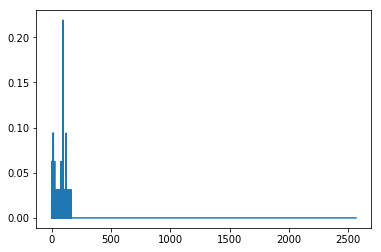

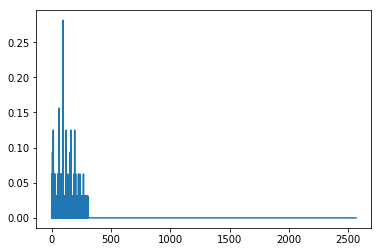

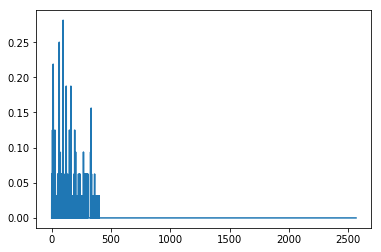

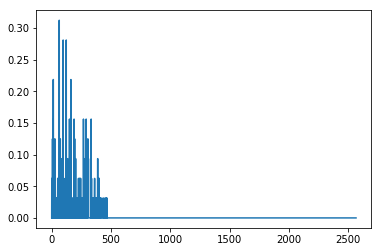

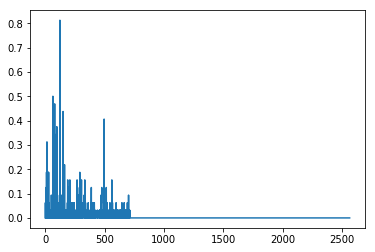

...

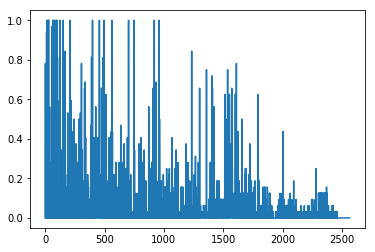

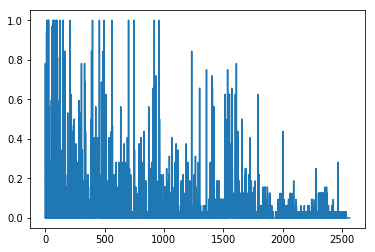

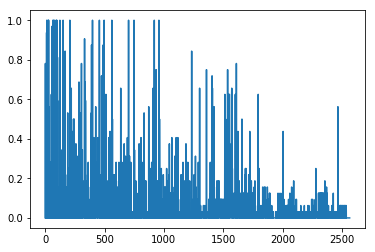

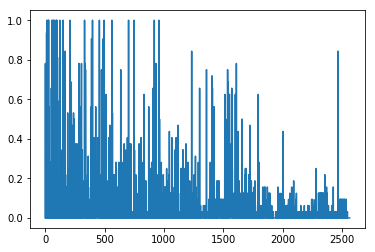

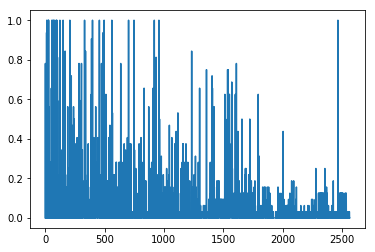

In [364]:

print(X0.shape)
for ck in range(32):
    plt.figure()
    plt.plot(X0[:,ck])
    plt.show()

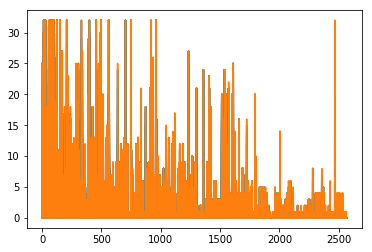

In [346]:
if (1):
    # Uncomment to normalize the input vector? 
    X0[X0>=32] = 32
    
    plt.figure()
    plt.plot(X0)
    plt.show()
    #myMax = np.max(X0)
    #X0 = (X0)/myMax # (np.mean(X0) * 2)
    #print(np.shape(X0[300:800,:]))

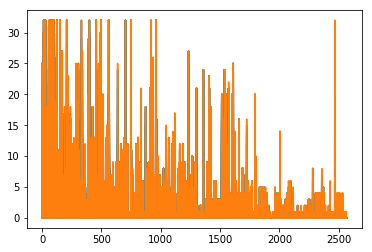

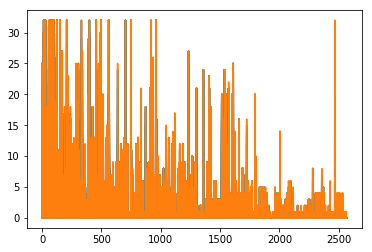

(2567, 32)
debug
test
Iteration 0 Error = 0.9696858565446046
Goodness = 19336.02012113855
Iteration 50 Error = 0.9696858565446046
Goodness = 15279.23596904823
Iteration 100 Error = 0.9696858565446046
Goodness = 11135.829095513851
Iteration 150 Error = 0.9695914430282787
Goodness = 6712.380550919659
Iteration 200 Error = 0.07680061362318628
Goodness = 3380.0680600884925
Iteration 250 Error = 0.05752858971381563
Goodness = 2074.6310022439034
Iteration 300 Error = 0.05729227419879712
Goodness = 1480.1805331076246
Iteration 350 Error = 0.04803925119155632
Goodness = 1204.9996467231651
Iteration 400 Error = 0.045117805706057855
Goodness = 1030.8245528962043
Iteration 450 Error = 0.04178932232687434
Goodness = 922.1184057675546


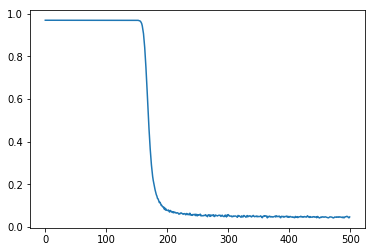

Finished with RBM training of size (2567, 512)
debug
test
Iteration 0 Error = 1.0172835961902054
Goodness = 15148.3664886321
Iteration 100 Error = 1.0172835961902054
Goodness = 7047.328332431314
Iteration 200 Error = 0.52606780744063
Goodness = -30.978638678892935
Iteration 300 Error = 0.34436346654436184
Goodness = -187.9358449729857
Iteration 400 Error = 0.3204164474690921
Goodness = -213.92912030979915
Iteration 500 Error = 0.30987055313146344
Goodness = -224.01773043022968
Iteration 600 Error = 0.3040877582665375
Goodness = -230.0103856616333
Iteration 700 Error = 0.2999164182943279
Goodness = -232.46638383438187
Iteration 800 Error = 0.29717990027542623
Goodness = -233.72841786247443
Iteration 900 Error = 0.29446976976763856
Goodness = -234.94346657642822


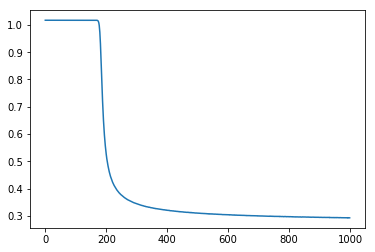

Finished with RBM training of size (512, 512)
debug
test
Iteration 0 Error = 1.0340057532644966
Goodness = 13833.934782811255
Iteration 100 Error = 1.0340057532644966
Goodness = 6408.273746248069
Iteration 200 Error = 0.5157248839649666
Goodness = -42.17032666204285
Iteration 300 Error = 0.34299138175567895
Goodness = -180.93381544644618
Iteration 400 Error = 0.3182989262036542
Goodness = -205.06453566349566
Iteration 500 Error = 0.30779652863843127
Goodness = -214.7105390085197
Iteration 600 Error = 0.30157027837788986
Goodness = -220.13496365338284
Iteration 700 Error = 0.29749893639259306
Goodness = -224.55360995616508
Iteration 800 Error = 0.29487430552950955
Goodness = -226.25242373665753
Iteration 900 Error = 0.29168167737651524
Goodness = -228.19975683168443


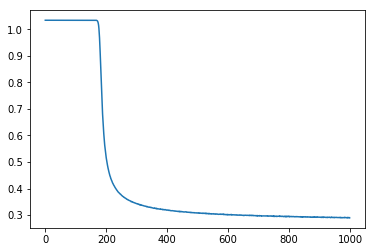

Finished with RBM training of size (512, 512)
debug
test
Iteration 0 Error = 1.0342428500560594
Goodness = 872.5892372658459
Iteration 100 Error = 1.0318640554705458
Goodness = 402.2969259329146
Iteration 200 Error = 0.5862155524131554
Goodness = 10.787347046962713
Iteration 300 Error = 0.4931045096333244
Goodness = -13.332763100984527
Iteration 400 Error = 0.488311893801419
Goodness = -14.118662796033064
Iteration 500 Error = 0.48757141432009893
Goodness = -13.885355196817711
Iteration 600 Error = 0.48684600175259957
Goodness = -13.864659671773413
Iteration 700 Error = 0.4872632666594999
Goodness = -13.900123069503016
Iteration 800 Error = 0.48618810020707687
Goodness = -13.785553647202406
Iteration 900 Error = 0.48664493674396203
Goodness = -13.747833088372861


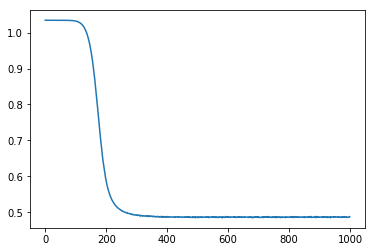

Finished with RBM training of size (512, 32)
Time to train RBMs 1440.7319979667664
(2567, 512)


In [347]:
# Pretrain network as a deep belief net (stack restricted Boltzmann machines)

from neuroFun import trainRBMLayers
plt.figure()
plt.plot(X0)
plt.show()
if (1):
    # Uncomment to normalize the input vector? 
    X0[X0>32] = 32
    
    plt.figure()
    plt.plot(X0)
    plt.show()
    myMax = np.max(X0)
    X0 = (X0)/myMax # (np.mean(X0) * 2)
    print(np.shape(X0))

t0 = time.time()
trainIt = 500
lR = 3e-3
#rbm13 = trainRBMLayers(a0,14,1e-1,trainIt)
if (1):
    rbm0 = trainRBMLayers(X0,512,lR,trainIt)
    rbm1 = trainRBMLayers(rbm0.T,512,lR,2*trainIt)
    rbm2 = trainRBMLayers(rbm1.T,512,lR,2*trainIt)
    rbm3 = trainRBMLayers(rbm2.T,32,lR,2*trainIt)

elapsed = time.time() - t0
print("Time to train RBMs " + str(elapsed))
print(np.shape(rbm0))

In [348]:
# The stacked RBMS become the layers of a FC neural net

myWeights = []
myWeights.append(rbm0)
myWeights.append(rbm1)
myWeights.append(rbm2)
myWeights.append(rbm3)
myWeights.append(rbm3.T)
myWeights.append(rbm2.T)
myWeights.append(rbm1.T)
myWeights.append(rbm0.T)

for layer in myWeights:
    print("Shape of layer: ", layer.shape)
np.save('./modelParameters/pretrainedWeights.npy',myWeights)



Shape of layer:  (2567, 512)
Shape of layer:  (512, 512)
Shape of layer:  (512, 512)
Shape of layer:  (512, 32)
Shape of layer:  (32, 512)
Shape of layer:  (512, 512)
Shape of layer:  (512, 512)
Shape of layer:  (512, 2567)


In [349]:
# Train the weights as a neural net 
#for layer in myWeights:
#    print("Shape of weights in layer: ", layer.shape)
#
myWeights = np.load('./modelParameters/pretrainedWeights.npy')
# Does the RBM pre-training help? Run the conditional below to se weights to random initializations

if(0):
    for ck in range(len(myWeights)):
        myWeights[ck] = np.random.random((np.shape(myWeights[ck])))*1e-1

t1 = time.time()
myIt = 1000
myLR = 9e-5
#(myInputs,myCrossInputs,myTarget,myWeights
#,myIter=10,lR=1e-5,myLambda=0,myMom=1e-5,stopEarly=False):
myNewWeights1 = backProp(X0,X0,X0,myWeights,myIt,myLR,1e-3,1e-3,True)
elapsed = time.time()-t1
print("time to train for" + str(myIt) + " iterations = "+str(elapsed) + " seconds")

Begin Training . . . 
Iteration 0 Mean error = 0.02487677612228782
Iteration 100 Mean error = 0.023763232561883646
Iteration 200 Mean error = 0.023306340807261523
Iteration 300 Mean error = 0.021668107259295927
Iteration 400 Mean error = 0.022630611321758157
Iteration 500 Mean error = 0.020807792237745124
Iteration 600 Mean error = 0.021448500256556553
Iteration 700 Mean error = 0.021007271130374
Iteration 800 Mean error = 0.020714277326480773
Iteration 900 Mean error = 0.021606452954519025
0.020606676632991084
time to train for1000 iterations = 383.9448046684265 seconds


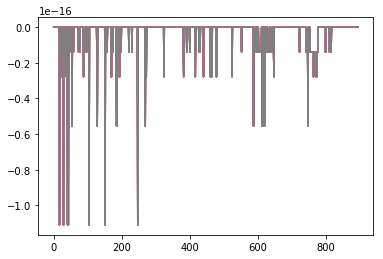

In [244]:
plt.figure()
test = X0.T-np.mean(X0,axis=1)
plt.plot(test.T)
plt.show()

In [331]:
np.save('./modelParameters/myNewWeights1.npy',myNewWeights1)

In [350]:
if(0):
    myBestWeights = np.load('./modelParameters/pretrainedWeights.npy')
else:
    myBestWeights =  myNewWeights1[1]


(32, 512)
(2567, 32)


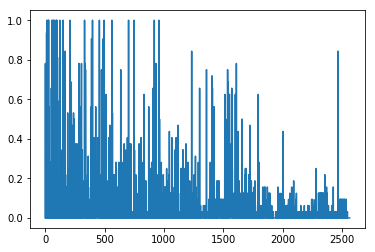

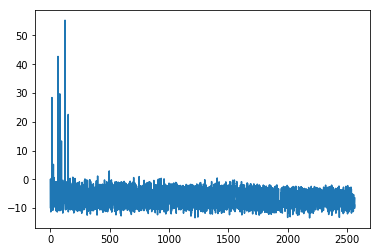

In [362]:
an,zn = forProp(X0,myBestWeights)
print(np.shape(an[0][:,:]))
print(np.shape(X0))

plt.figure()
plt.plot(X0[:,30])
plt.figure()
plt.plot(zn[7][26].T)
plt.show()


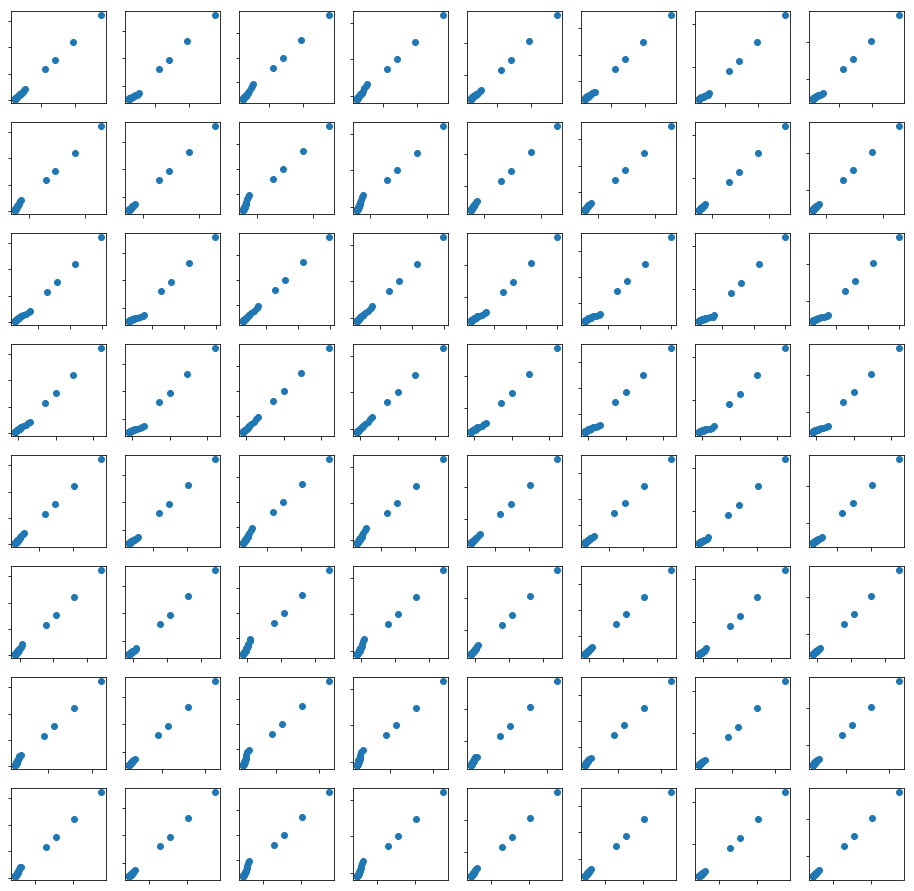

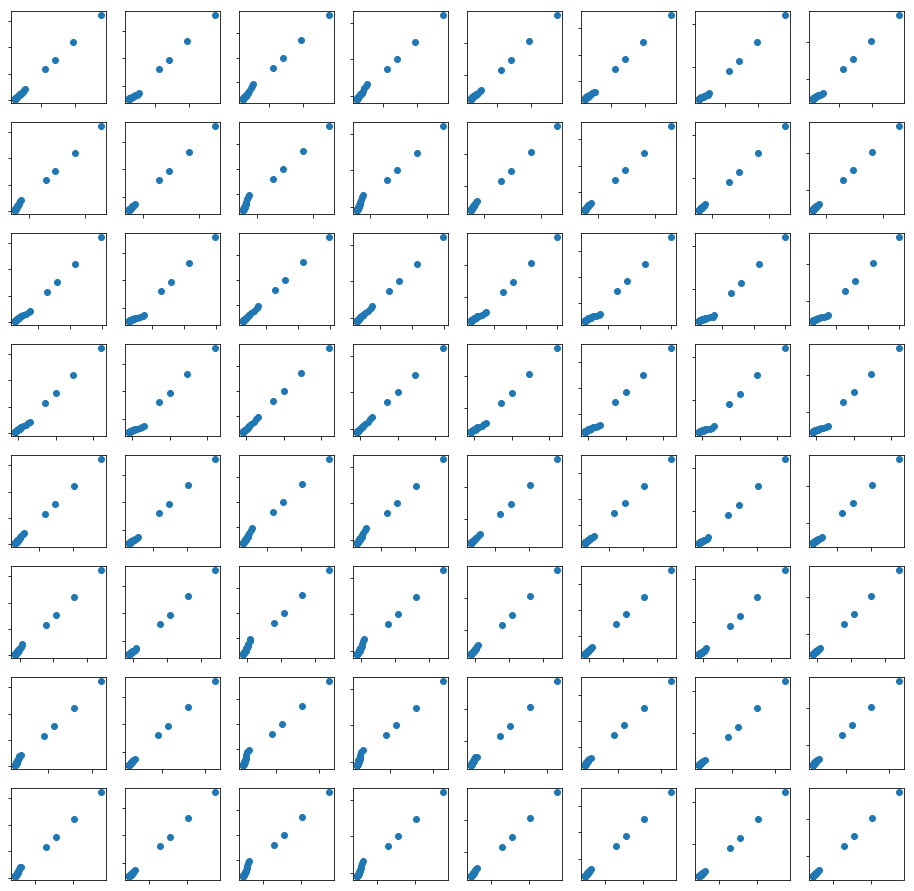

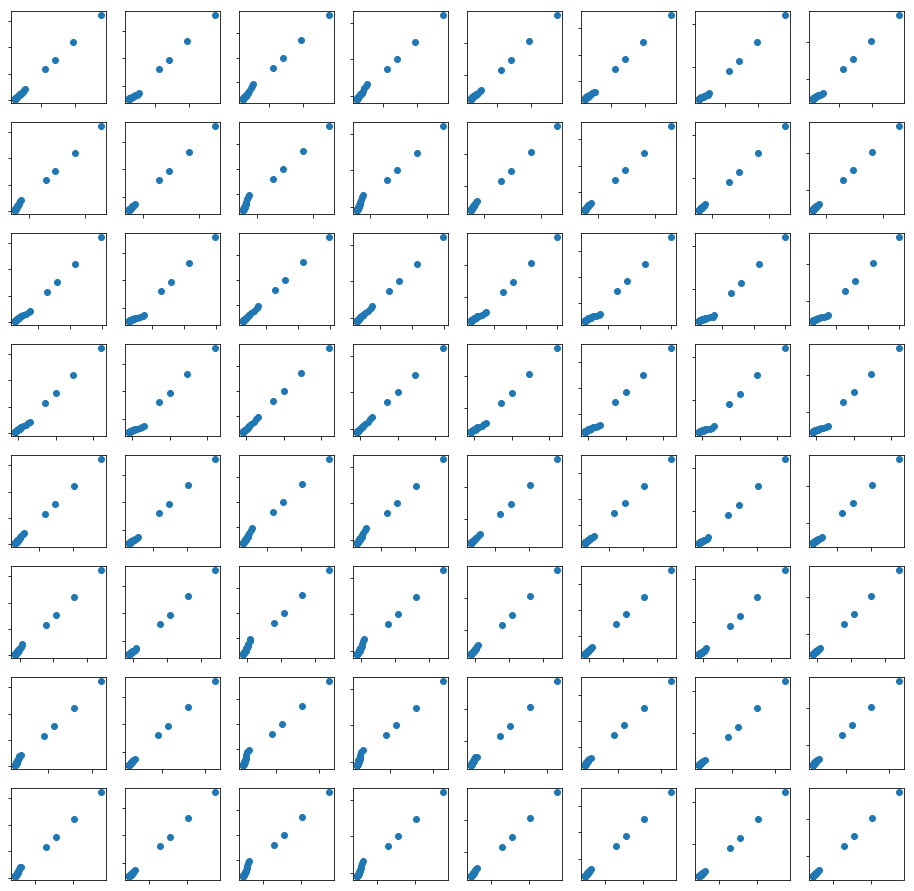

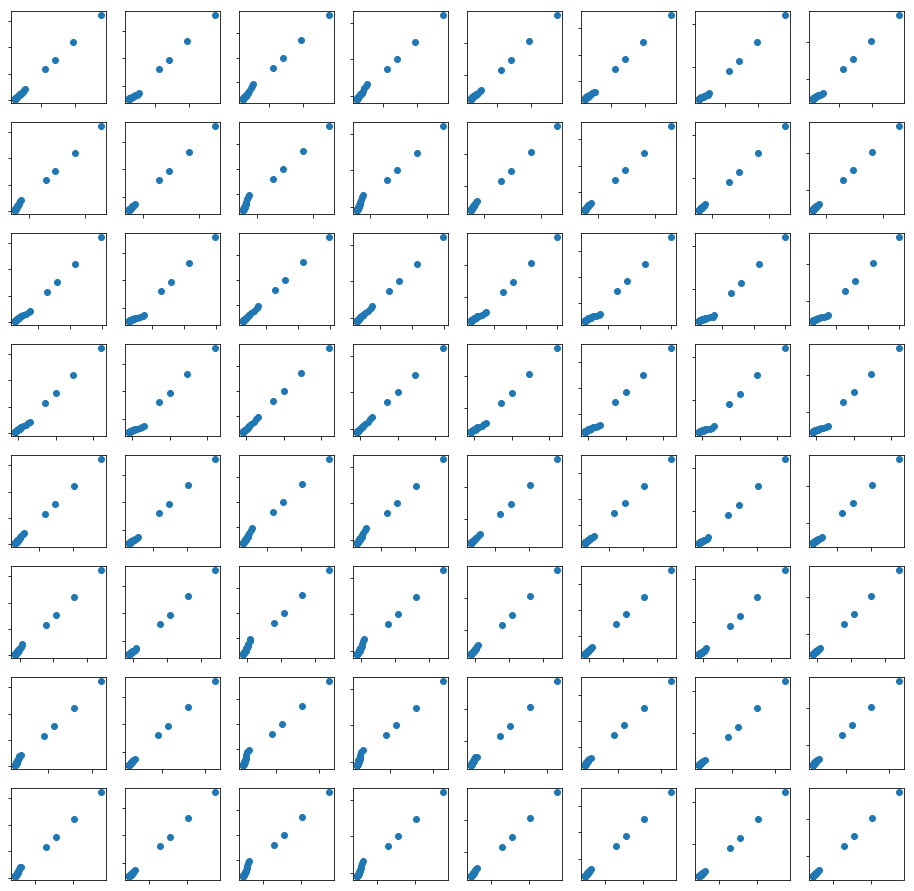

In [352]:
if (1):
    for ck in range(4):
        myFig, myAx = plt.subplots(8,8,figsize=(16,16))
        for cx in range(8):
            for cy in range(8):
                myAx[cx,cy].plot(an[3][:,cx].T,an[3][:,cy].T,'o')
                myAx[cx,cy].set_xticklabels([])
                myAx[cx,cy].set_yticklabels([])
        plt.show()

(32,)
2567


/home/radlr/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


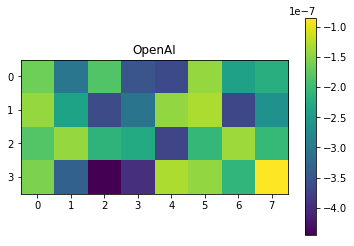

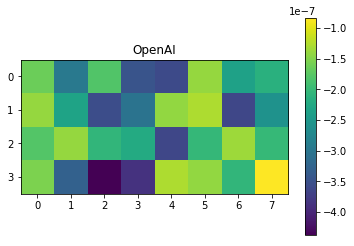

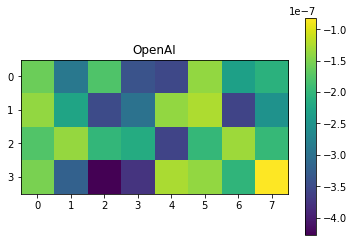

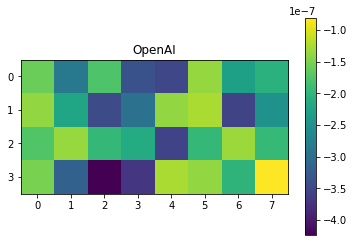

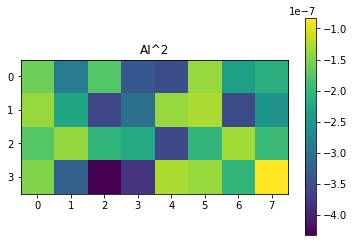

...

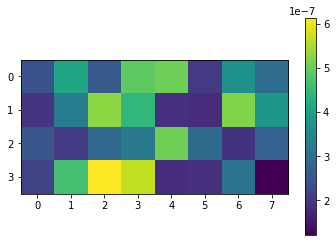

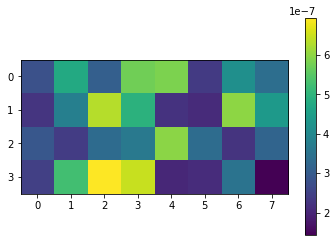

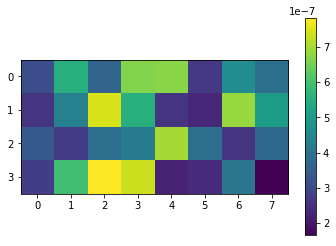

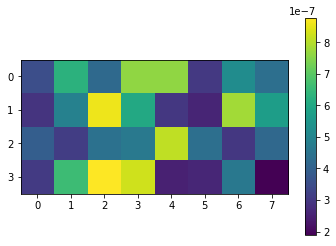

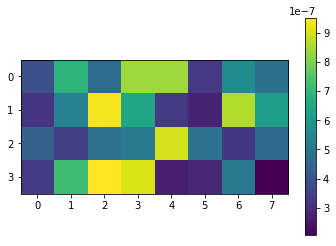

In [335]:
print(np.mean(an[3][:,:],axis=0).shape)
print(len(X0))
if(1):
    for ck in range(32):
        plt.figure()
        
        plt.imshow(np.reshape(an[3][ck,:]-np.mean(an[3][:,:],axis=0),(4,8)))
        plt.colorbar()
        if ck<4:
            plt.title("OpenAI")
        elif(ck<8):
            plt.title("AI^2")
        elif(ck<12):
            plt.title("Deepmind")
        elif(ck<16):
            plt.title("UO Eng. Sci.")
            
plt.show()

(32, 32)


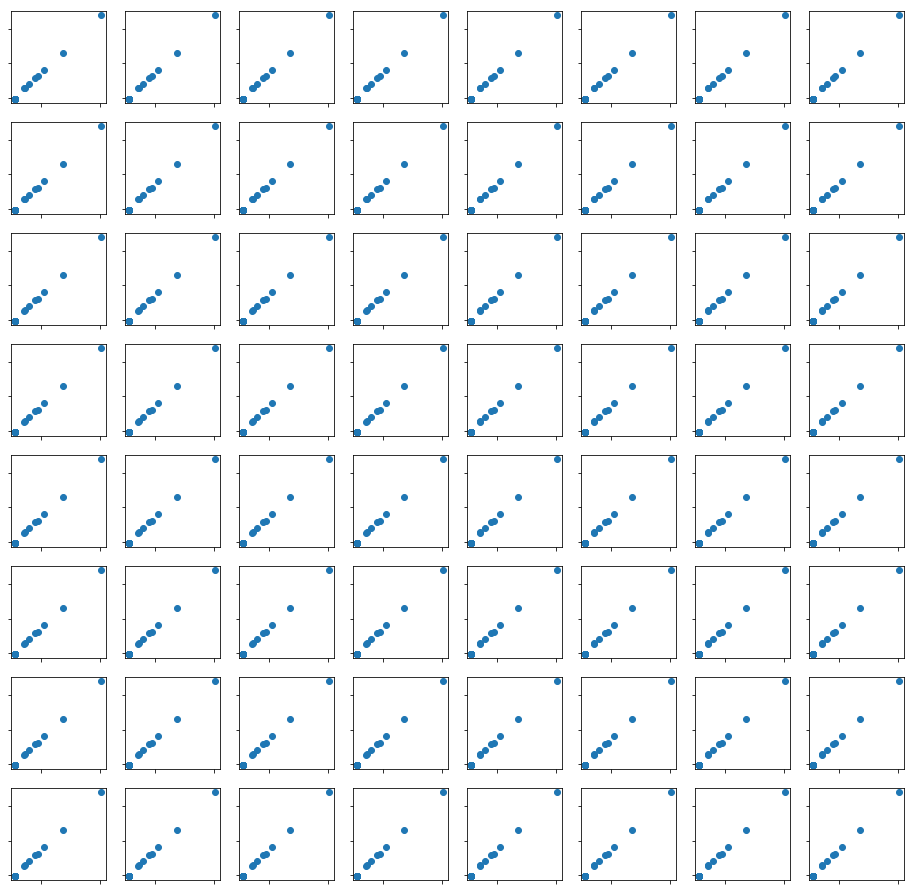

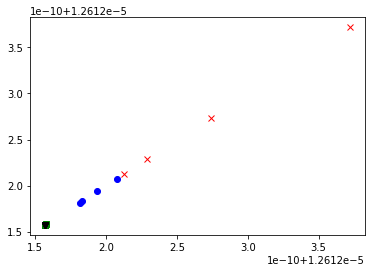

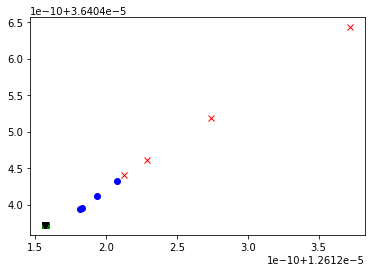

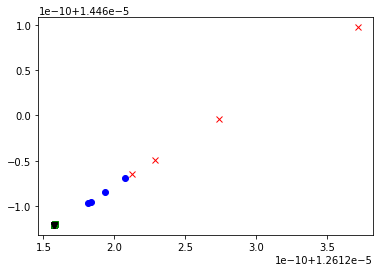

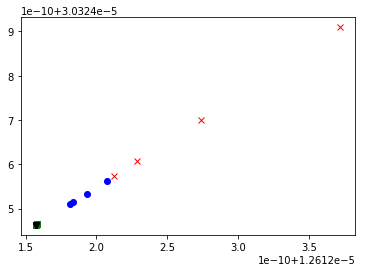

...

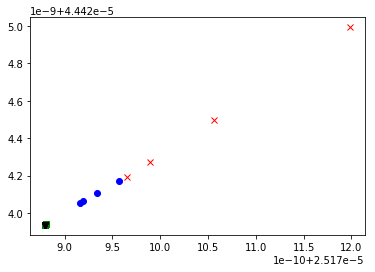

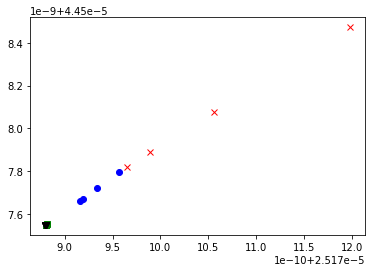

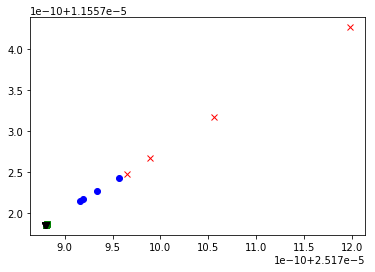

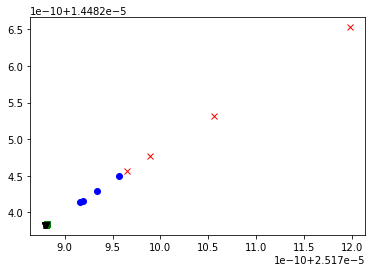

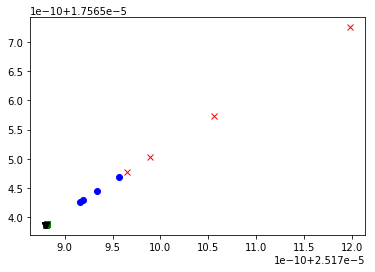

KeyboardInterrupt: 

In [110]:


#an,zn = forProp(X0,myWeights)

an,zn = forProp(X0,myBestWeights)
print(np.shape(an[3][:,:]))

if (1):
    myFig, myAx = plt.subplots(4,8,figsize=(16,16))
    for cx in range(0,4):
        for cy in range(8):
            myAx[cx,cy].plot(an[3][:,cx].T,an[3][:,cy].T,'o')
            myAx[cx,cy].set_xticklabels([])
            myAx[cx,cy].set_yticklabels([])
plt.show()
plt.figure()
for ci in range(32):
    for cj in range(32):
        for ck in range(32):
            if(ck<4):
                plt.plot(an[3][ck,ci],an[3][ck,cj],'rx',label="openai")       
            elif(ck<8):
                plt.plot(an[3][ck,ci],an[3][ck,cj],'bo',label="allen institute")
            elif(ck<12):
                plt.plot(an[3][ck,ci],an[3][ck,cj],'gs',label="deepmind")
            else:
                plt.plot(an[3][ck,ci],an[3][ck,cj],'kv',label="UO Engineering")
        plt.show()#plt.legend()
    
    
print(an[3].shape)
if(1):
    for ck in range(13):
        plt.figure()

        plt.imshow(np.reshape(an[3][ck,:]-np.mean(an[3][ck,:],axis=0),(8,4)))
        plt.colorbar()
plt.show()

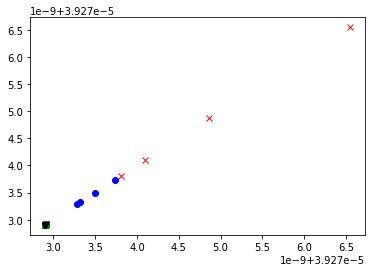

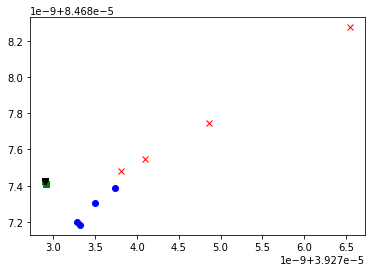

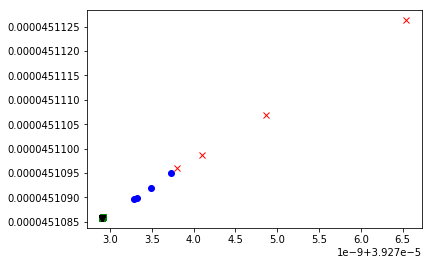

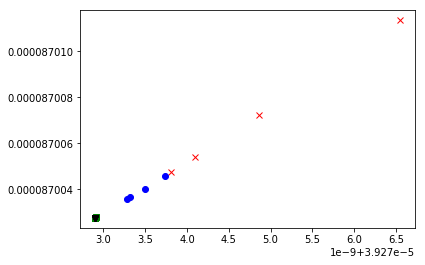

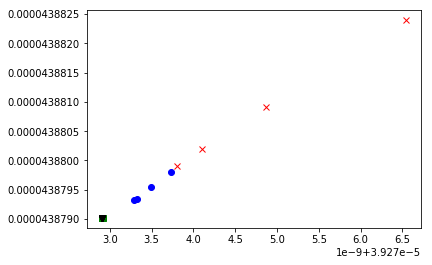

...

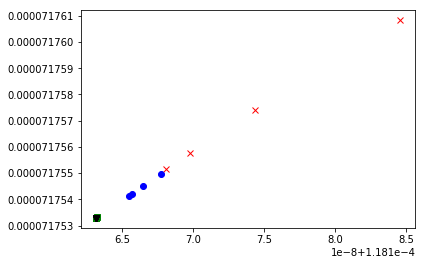

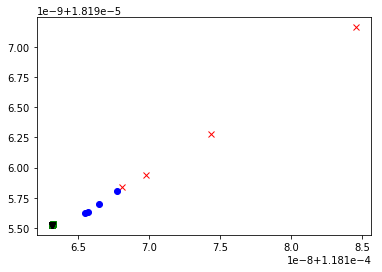

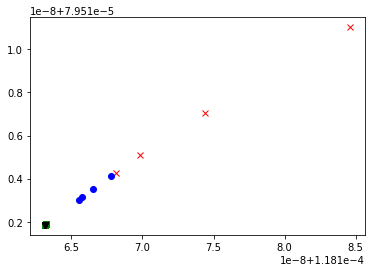

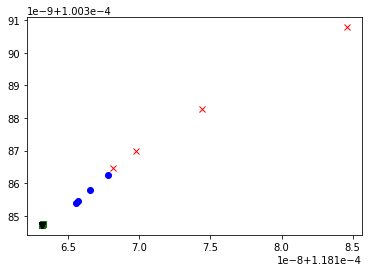

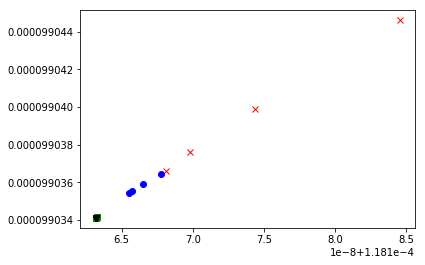

KeyboardInterrupt: 

In [141]:
plt.figure()
for ci in range(32):
    for cj in range(32):
        for ck in range(32):
            if(ck<4):
                plt.plot(an[3][ck,ci],an[3][ck,cj],'rx',label="openai")       
            elif(ck<8):
                plt.plot(an[3][ck,ci],an[3][ck,cj],'bo',label="allen institute")
            elif(ck<12):
                plt.plot(an[3][ck,ci],an[3][ck,cj],'gs',label="deepmind")
            else:
                plt.plot(an[3][ck,ci],an[3][ck,cj],'kv',label="UO Engineering")
        plt.show()#plt.legend()

(32,)


/home/radlr/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


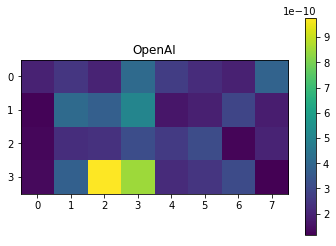

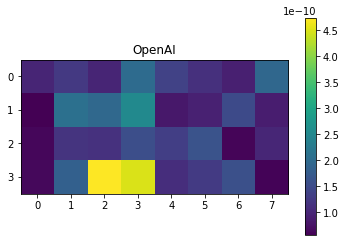

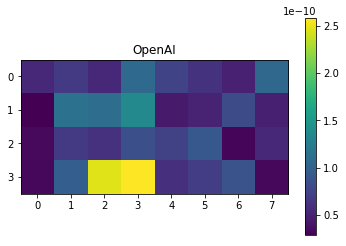

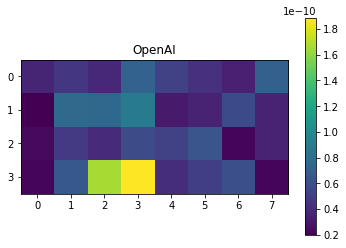

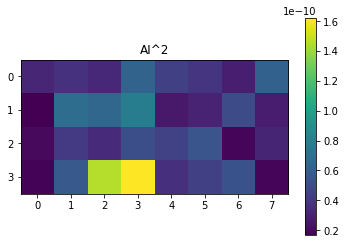

...

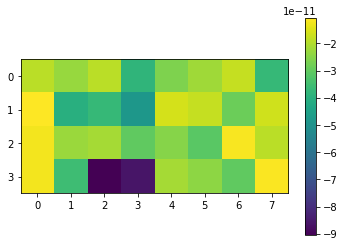

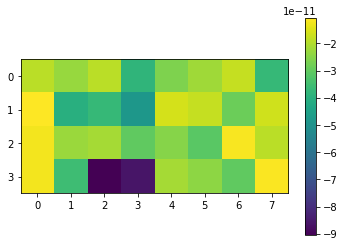

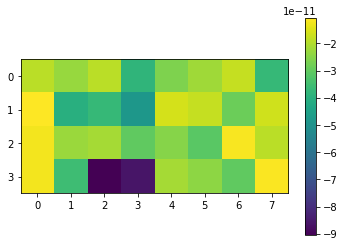

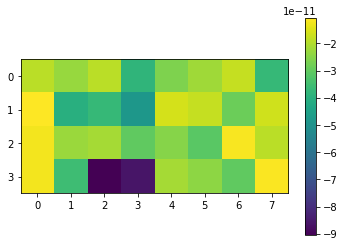

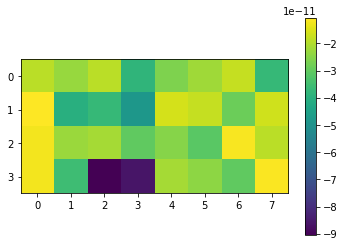

In [105]:
print(np.mean(an[3][:,:],axis=0).shape)
if(1):
    for ck in range(32):
        plt.figure()
        
        plt.imshow(np.reshape(an[3][ck,:]-np.mean(an[3][:,:],axis=0),(4,8)))
        plt.colorbar()
        if ck<4:
            plt.title("OpenAI")
        elif(ck<8):
            plt.title("AI^2")
        elif(ck<12):
            plt.title("Deepmind")
        elif(ck<16):
            plt.title("UO Eng. Sci.")
            
plt.show()

In [414]:
#Convert the job descriptions to BOW vectors

myTemp = bowDictJD
X = np.array([[1]])
X0 = np.array([[0],[0]])

if(1):
    for jd in myJDs:
        # Scan through each word in each job description, add to worcount vectors for each entry
        for word in jd:
            if word in myTemp:
                myTemp[word] += 1
        # store the BOW vector in the input vector
        X = np.array([[1]])
        for k, v in myTemp.items():
        #    print(k,v)
            X = np.append(X,[[v]],1)
        if (len((X0[0])) > 2):
            X0 = (np.append(X0,X,0))
        else:
            X0 = X
                
X0 = X0.T
print(np.shape(X0))
for ck in range(13):
    print(np.sum(X0[:,ck]))
print("Shape of input vector = ",np.shape(X0))
if (0):
    # Uncomment to normalize the input vector? 
    # clip words with frequency > 5
    #X0[X0>150] = 150
    myMax = 1.0*np.max(X0)
    X0 = (X0)/myMax # (np.mean(X0) * 2)
    print(np.shape(X0))


if(0):
    for ck in range(13):
        plt.figure()
        plt.plot(X0[:,ck]-np.mean(X0,axis=1))
        #plt.figure()
        #plt.plot(np.mean(X0,axis=1))
        plt.show()
#print(bowDictJD)

plt.figure(figsize=(22,5))

mySortOrder = np.argsort(np.sum(X0,axis=0))[::-1]
myTest = np.take(np.sum(X0,axis=0),mySortOrder,0)
print(np.shape(mySortOrder))

myKeys = list(bowDictJD.keys())
print(np.shape(myKeys))
myTest2 = np.take(myKeys,mySortOrder,0)
#outVecs = myTest
print(np.shape(outVecs))

print(np.shape(myTest))
plt.bar(range(len(outVecs[0:32,:])), myTest[0:32], align='center')

plt.xticks(range(len(outVecs[0:32,:])), myTest2,rotation=70)

plt.show()

(1597, 13)
1151089
1167239
1183436
1199599
1215734
1216683
1217715
1218830
1219743
1220496
1221342
1222226
1223032
Shape of input vector =  (1597, 13)
(13,)
(1596,)
(5, 964)
(13,)


ValueError: shape mismatch: objects cannot be broadcast to a single shape

In [416]:

plt.figure(figsize=(22,5))

mySortOrder = np.argsort(np.sum(X0.T,axis=0))[::-1]
myTest = np.take(np.sum(X0.T,axis=0),mySortOrder,0)
print(np.shape(mySortOrder))

myKeys = list(bowDictJD.keys())
print(np.shape(myKeys))
myTest2 = np.take(myKeys,mySortOrder,0)
#outVecs = myTest
print(np.shape(outVecs))

print(np.shape(myTest))
plt.bar(range(len(outVecs[0:32,:])), myTest[0:32], align='center')

plt.xticks(range(len(outVecs[0:32,:])), myTest2,rotation=70)

plt.show()

(1597,)
(1596,)


IndexError: index 1596 is out of bounds for axis 0 with size 1596

(964,)
(964,)
(964,)


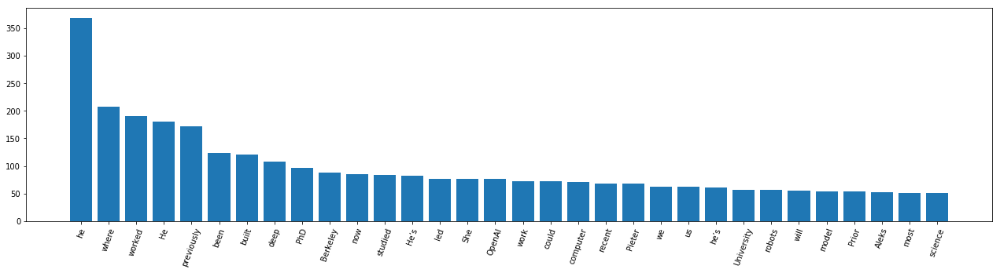

In [413]:
plt.figure(figsize=(22,5))

mySortOrder = np.argsort(np.sum(ftVecs,axis=0))[::-1]
myTest = np.take(np.sum(ftVecs,axis=0),mySortOrder,0)
print(np.shape(mySortOrder))

myKeys = list(myBowDict.keys())
print(np.shape(myKeys))
myTest2 = np.take(myKeys,mySortOrder,0)

print(np.shape(myTest))
plt.bar(range(len(outVecs[0,0:32])), myTest[0:32], align='center')

plt.xticks(range(len(outVecs[0,0:32])), myTest2,rotation=70)

plt.show()

In [398]:
myBios = ["Rive Sunder "]

In [410]:
import sklearn
from sklearn.manifold import TSNE

mySeed = 42
myModel2d = TSNE(n_components=2,random_state=mySeed)#,init='pca')
myModel3d = TSNE(n_components=3,random_state=mySeed)#,init='pca')
bios2d = myModel2d.fit_transform(allBioVecs)
bios3d = myModel3d.fit_transform(allBioVecs)



from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt


NameError: name 'allBioVecs' is not defined

In [5]:
if(1):
    myFile = open("./allOpenAIBios.txt",'w')
    for shortBios in [openaiFulltime, openaiInterns]:
        for shortBio in shortBios:
            myFile.write(shortBio)
    myFile.close()

In [3]:
"""Data"""

# short bios manually scraped from openAI website. 
# short bios of full-timers
openaiFulltime = ['Pieter is a professor at UC Berkeley specializing in making robots learn. He’s been giving us advice since before OpenAI was born, and now he’s taking a leave from Berkeley to work with us full-time. Pieter and his lab members have been responsible for some of the most striking advances in robot learning and deep reinforcement learning (RL) in recent years. Together, we will explore ways to combine unsupervised learning with RL, which we believe could address fundamental limitations in today’s RL algorithms. ',\
                'Shivon is a partner at Bloomberg Beta focusing on machine intelligence. She has an extremely broad view of how the space is evolving (and has written extensively on the landscape). We’ve been going to her for advice for the past few months, and now she’s becoming an official advisor to OpenAI. ',\
                'Yura finished a math PhD at the age of 24, and switched into machine learning a year and a half ago. He’s focusing on generative models. He discovered a simple but fundamental improvement to the variational lower bound that had evaded notice since its original discovery decades ago.',\
                'Ian is well known for his many contributions to machine learning, including the MaxOut Network and the Generative Adversarial Network, the latter of which is a driver of excitement in generative modeling research. In addition, he’s the lead author of the book on deep learning.',\
                'Alec created DCGAN, a neural model that could generate large, coherent images containing an unprecedented level of global coherence and detail. In addition, his model has learned to do image analogies in an entirely unsupervised way.',\
                'Aleks is a recent graduate from Berkeley where he did research on distributed machine learning and taught Data Structures and Operating Systems for 2 years. Previously, Aleks was an intern at Stripe working on the Financial Operations team.',\
                'Alex previously built radio encryption systems for small satellites at Planet Labs. Prior to that he worked on aerial robots at Airware. He has a degree in Textile Engineering from NCSU, where he worked on a design for an inflatable habitat for living on Mars.',\
                'Ankur obtained his PhD in real-time camera tracking at Imperial College London, then became a post-doc at the University of Cambridge to focus on scene understanding via his work on SceneNet. He returned to Imperial as a Dyson Fellow to continue his research on scene understanding with SceneNet RGB-D. His interests lie at the intersection of hardware, SLAM, and deep learning.',\
                'Bob formerly led engineering and product management at Palantir, having worked there for a decade as it grew from 10 to 1,500 employees. Before Palantir, Bob was a PhD candidate in the Stanford Artificial Intelligence Lab working on multiagent systems. At OpenAI, he focuses on robotics.',\
                'Christopher was previously an engineer at Facebook, where he worked on Presto, an open-source distributed SQL engine. He led the data warehouse deployment of Presto, and scaled it to hundreds of petabytes of data. In his spare time, he builds quadrotors and created Rospilot, an autopilot companion system that provides real-time video streaming and other features, using commodity hardware.',\
                'Erika was previously the Director of Product Engineering at Planet Labs, where she spent the last four years building teams and software to support collecting and distributing high-frequency satellite imagery, ranging from mission control and manufacturing management, to image processing and platform design. She studied mechanical engineering and computer science at MIT. As OpenAI’s Engineering Director, Erika will help manage and grow the team.',\
                'Jakub recently finished a PhD at CMU where he worked on the theory of optimization. He co-invented the fastest known algorithms for solving linear systems on graphs and computing the geometric median. In the past, Jakub was a top competitive programmer, and has won the Google Code Jam and gained a gold medal in the ACM-ICPC.',\
                'Jeremy is an engineer who previously worked at Mailgun and Google. Since joining OpenAI he has built the tight encoding implementation for OpenAI Universe’s go-vncdriver and tools for collecting human demonstrations of Universe environments.',\
                'Jonathan previously built a peer-to-peer file sync tool at AeroFS, and was an early engineer at Magic, an SMS-based virtual personal assistant. Prior to that, he studied Electrical & Computer Engineering at the University of Toronto. In high school and during his undergrad, he built software for cancer treatment at Sunnybrook Research Institute’s Focused Ultrasound Group.',\
                'Peter was an engineering lead at Dropbox, where he led the photos infrastructure, computer vision, and machine learning teams. Before that, he co-founded AI startup Anchovi Labs and did his graduate work at Caltech in computer vision and crowd sourcing.',\
                'Rachel most recently worked on data engineering at Locu. In the past she’s designed robots, and built a haptic surgical simulator, a $50 desktop 3D scanner, and an NLP backend to extract data from uploaded documents to create personalized curriculums for learning language. She studied computer science at MIT',\
                'Shariq founded an OCR startup, and previously worked at Gigster. He also builds DIY projects, like a $80 VR treadmill, a portable shower, and a device to control a mouse cursor with a tongue. He studied Computer Science and Electrical Engineering at the University of Maryland, where he founded a hackathon club which won the first-ever Major League Hacking season.',\
                'Tom was the cofounder and CTO of Grouper, where he wrote algorithms that used Facebook data to match up millions of people so they could meet in the real world. Before that he studied computational cognitive science at MIT, and built early versions of the core server at MoPub, now the world’s largest mobile ad server.',\
                'Szymon previously worked on model-based reinforcement learning at Vicarious, question answering at MetaMind, and on real-time file processing infrastructure at Dropbox. He earned his master’s degree from MIT, where he explored reinforcement learning approaches to multi-stage reasoning in natural language processing, and identified security flaws in Android.',\
                'Yaroslav was previously an engineer at Google Brain and Google Streetview, where he implemented and trained large-scale neural networks. He designed the first system that outperformed humans at recognizing outdoor house numbers.',\
                'Marcin received 3 gold medals in the IOI, and has been a top participant in programming competitions such as TopCoder and ACM-ICPC. He’s been in deep learning for a year and has already made strong progress on neural memory architectures.',\
                'Rafał began his career in competitive programming and the finance industry. He’s now been in deep learning for a year and a half, and his results include the state-of-the-art language model.',\
                'Kate has a versatile background, with experience across operations, office administration, user research, community, and support. She previously helped Academia.edu run smoothly.',\
                'Ludwig was previously Stripe’s Creative Director, where he built and led the design team.',\
                'Jonas did much of the engineering heavy lifting on OpenAI Gym. A recent college graduate, he was previously an intern at Stripe, where he helped build Stripe CTF3.',\
                'Jie was an engineer at Dropbox for almost five years, where he led the team responsible for the core file sync technology running on hundreds of millions of desktops. Prior to that he worked in Pieter Abbeel’s robotics lab at Berkeley, working on autonomous helicopters, RGBD perception, and Starcraft bots.',\
                'Dario was one of the lead authors of Deep Speech 2, a speech system which achieved near-human performance on many speech tasks. He is also a main co-author of “Concrete Problems in AI Safety”, which highlights issues related to accidents in machine learning systems. Prior to OpenAI, he worked at Google Brain.',\
                'Filip’s recent background is in “practical” modeling, having spent the last few years working in the high-frequency trading space. In the past he enjoyed problem-solving in programming competitions, and won the IOI and ACM ICPC.',\
                'Jack has spent the past few years writing about artificial intelligence and distributed systems, most recently at Bloomberg and BusinessWeek. His articles have covered technologies like memory networks, image generation, and reinforcement learning for robots, and issues like diversity within AI. As our Strategy and Communications Director, he will help with community outreach, policy, communications, and strategy.',\
                'Scott was previously an engineer at Nervana Systems where he focused on optimizing the performance of deep networks on GPUs. His assembly-level optimizations for dense linear algebra and convolution remain the fastest available. When not writing software he’s usually spending his time reading up on the latest research in neuroscience and related fields.',\
                'Zain previously led deep learning efforts to build a collaborative human-machine intelligence system at Clara Labs. He’s also worked on speech synthesis and computational neuroscience, built Mosaic, and founded a mobile behavioral analytics company. He most recently built a GIF search engine using deep multimodal embeddings.'\
                 ]

# bios of interns/visitors
openaiInterns = ['Catherine built OpenAI Gym’s REST API, which has already attracted users in Lua, C++, Java, and Rust. She graduated with a perfect GPA in CS and Brain & Cognitive Science from MIT, and has extensive research experience in computational neuroscience and psychology. Catherine has taught programming and applied math for six years, including outreach to women and underrepresented minorities.',\
                'Harri is a PhD student at the University of Edinburgh, where he is researching models that can quickly adapt to new situations by learning to represent datasets.',\
                'Igor is interested in optimal control, machine learning, and their applications to robotics, biomechanics, and neuroscience. His PhD was in automated discovery and learning of complex movement behaviors. He will join the faculty at CMU in September 2017.',\
                'Taco is a PhD student working on applied and theoretical problems in representation learning. Most recently he invented group equivariant convolutional neural networks (G-CNNs), a generalization of CNNs that improves the statistical efficiency of these models by exploiting symmetries.',\
                'Tambet is a PhD student from University of Tartu, Estonia. He previously worked as a software engineer and founded his own startup. His recent projects range from making deep reinforcement learning agents cooperate to predicting a rat’s location from its brain activity. He also wrote an accessible introduction to deep Q-learning.',\
                'Prafulla was a gold medalist in the IMO, IPhO, and IAO. He’s currently an undergraduate at MIT, performing research on learning of invariant representations for speech and vision tasks.',\
                'Paul is a PhD student at Berkeley who has written extensively about AI safety. He received best paper and best student paper awards at STOC for research on optimization and online learning.',\
                'Tim is an expert on variational methods. The author of the first paper on stochastic gradient variational inference (for which he won the Lindley prize), he was at one point ranked number 2 overall on Kaggle.',\
                'Peter previously co-founded a startup and did research on parallel computing and cognitive science. Recently, he’s been working on reinforcement learning, from theory to applications with deep neural nets.',\
                'Rocky is a PhD student who previously co-founded a startup (with Peter) and worked on a number of projects in robotics. He’s now transitioned to the field of deep reinforcement learning, and recently TA’d Berkeley’s Deep Reinforcement Learning class.',\
                'Although Linxi is just finishing up his undergrad, he has already worked on a variety of projects in deep learning, including Deep Speech 2.',\
                'Jon is an undergraduate student whose achievements include, among others, a method that makes it possible to efficiently train large recursive neural networks on large datasets.',\
                'Jonathan is a PhD student at Stanford, where he is developing a new approach to imitation learning. Earlier in his research career, he had success teaching robots how to tie knots.',\
                'Rein hails from Belgium, started his research career in the field of computer networking, and now is developing novel ways to incorporate uncertainty into deep reinforcement learning algorithms.',\
                'Eric is a professor of theoretical computer science at UT Austin. His achievements include the development and the analysis of a faster-than-n log n sparse Fourier transform. In his past life, he achieved a perfect score at the IOI.'\
                ]

outgroup = ["Jebediah is one of the original four kerbonauts,\
            along with Bill, Bob, and Valentina who wear the orange jump suits \
            instead of the customary grey ones. He is the only default male kerbal \
            with the attribute badS = True. Short for 'badass', this makes Jeb's \
            facial expression and general reaction be 'happy'' ones in almost all\
            situations which might trigger 'afraid'' reactions in the typical kerbonaut. \
            Whatever effect his dead-middle ratings for Courage and Stupidity would \
            have on personality are overridden by his sheer badassery. Valentina Kerman \
            is often considered a female equivalent to Jebediah Kerman and also has the badS = \
            True attribute,the two are the only default kerbals with the badS flag.",\
            "Mario is a fictional character in the Mario video game franchise, owned by Nintendo and created by Japanese video game designer Shigeru Miyamoto. Serving as the company's mascot and the eponymous protagonist of the series, Mario has appeared in over 200 video games since his creation. Depicted as a short, pudgy, Italian plumber who resides in the Mushroom Kingdom, his adventures generally center upon rescuing Princess Peach from the Koopa villain Bowser. His younger brother and sidekick is Luigi.",\
            "Luigi is a fictional character featured in video games and related media released by Nintendo. Created by prominent game designer Shigeru Miyamoto, Luigi is portrayed as the slightly younger but taller fraternal twin brother of Nintendo's mascot Mario, and appears in many games throughout the Mario franchise, often as a sidekick to his brother.",\
            "The saiga antelope is a critically endangered antelope that originally inhabited a vast area of the Eurasian steppe zone from the foothills of the Carpathian Mountains and Caucasus into Dzungaria and Mongolia.",\
            "Sonic, the protagonist, is an anthropomorphic blue hedgehog with supersonic speed, capable of reaching the speed of sound. Typically, Sonic—usually along with some of his friends, such as Tails, Amy, and Knuckles—must stop antagonist Doctor Eggman's plans for world domination."\
           ]


np.save('./data/openAIFullTimeBios.npy',openaiFulltime)
np.save('./data/openAIInternBios.npy',openaiInterns)
np.save('./data/outgroup.npy',outgroup)

In [409]:
fig2d = plt.figure()

ax2d = fig2d.add_subplot(111)
ax2d.scatter(bios2d[0:noInterns,0],bios2d[0:noInterns,1],color=[0,1,0],label="Interns")
ax2d.scatter(bios2d[noInterns:noFT+noInterns,0],bios2d[noInterns:noFT+noInterns,1],color=[1,0,0],label="Full Time")
ax2d.scatter(bios2d[noFT+noInterns:noFT+noInterns+noMyBios,0],bios2d[noFT+noInterns:noFT+noInterns+noMyBios,1],color=[0,0,1],label="theScinder")
ax2d.scatter(bios2d[noFT+noInterns+noMyBios:len(bios2d),0],bios2d[noFT+noInterns+noMyBios:len(bios2d),1],color=[1,1,0],label="Out group")

ax2d.legend()

axLimits = 700

fig3d = plt.figure()
ax3d = fig3d.add_subplot(111, projection='3d')

ax3d.scatter(bios3d[0:noInterns,0],bios3d[0:noInterns,1],bios3d[0:noInterns,2],color=[0,1,0],label="Interns")
ax3d.scatter(bios3d[noInterns:noFT+noInterns,0],bios3d[noInterns:noFT+noInterns,1],bios3d[noInterns:noFT+noInterns,2],color=[1,0,0],label="Full time")
ax3d.scatter(bios3d[noFT+noInterns:noFT+noInterns+noMyBios,0],bios3d[noFT+noInterns:noFT+noInterns+noMyBios,1],bios3d[noFT+noInterns:noFT+noInterns+noMyBios,2],color=[0,0,1],label="theScinder")
ax3d.scatter(bios3d[noFT+noInterns+noMyBios:len(bios3d),0],bios3d[noFT+noInterns+noMyBios:len(bios3d),1],bios3d[noFT+noInterns+noMyBios:len(bios3d),2],color=[1,1,0],label="Out group")
ax3d.axis([-axLimits,axLimits,-axLimits,axLimits])
ax3d.legend()
plt.show()

NameError: name 'bios2d' is not defined

In [397]:
help(TSNE)

Help on class TSNE in module sklearn.manifold.t_sne:

class TSNE(sklearn.base.BaseEstimator)
 |  t-distributed Stochastic Neighbor Embedding.
 |  
 |  t-SNE [1] is a tool to visualize high-dimensional data. It converts
 |  similarities between data points to joint probabilities and tries
 |  to minimize the Kullback-Leibler divergence between the joint
 |  probabilities of the low-dimensional embedding and the
 |  high-dimensional data. t-SNE has a cost function that is not convex,
 |  i.e. with different initializations we can get different results.
 |  
 |  It is highly recommended to use another dimensionality reduction
 |  method (e.g. PCA for dense data or TruncatedSVD for sparse data)
 |  to reduce the number of dimensions to a reasonable amount (e.g. 50)
 |  if the number of features is very high. This will suppress some
 |  noise and speed up the computation of pairwise distances between
 |  samples. For more tips see Laurens van der Maaten's FAQ [2].
 |  
 |  Read more in the 

In [1]:
"""Data"""

# short bios manually scraped from openAI website. 
# short bios of full-timers
openaiFulltime = ['Pieter is a professor at UC Berkeley specializing in making robots learn. He’s been giving us advice since before OpenAI was born, and now he’s taking a leave from Berkeley to work with us full-time. Pieter and his lab members have been responsible for some of the most striking advances in robot learning and deep reinforcement learning (RL) in recent years. Together, we will explore ways to combine unsupervised learning with RL, which we believe could address fundamental limitations in today’s RL algorithms. ',\
                'Shivon is a partner at Bloomberg Beta focusing on machine intelligence. She has an extremely broad view of how the space is evolving (and has written extensively on the landscape). We’ve been going to her for advice for the past few months, and now she’s becoming an official advisor to OpenAI. ',\
                'Yura finished a math PhD at the age of 24, and switched into machine learning a year and a half ago. He’s focusing on generative models. He discovered a simple but fundamental improvement to the variational lower bound that had evaded notice since its original discovery decades ago.',\
                'Ian is well known for his many contributions to machine learning, including the MaxOut Network and the Generative Adversarial Network, the latter of which is a driver of excitement in generative modeling research. In addition, he’s the lead author of the book on deep learning.',\
                'Alec created DCGAN, a neural model that could generate large, coherent images containing an unprecedented level of global coherence and detail. In addition, his model has learned to do image analogies in an entirely unsupervised way.',\
                'Aleks is a recent graduate from Berkeley where he did research on distributed machine learning and taught Data Structures and Operating Systems for 2 years. Previously, Aleks was an intern at Stripe working on the Financial Operations team.',\
                'Alex previously built radio encryption systems for small satellites at Planet Labs. Prior to that he worked on aerial robots at Airware. He has a degree in Textile Engineering from NCSU, where he worked on a design for an inflatable habitat for living on Mars.',\
                'Ankur obtained his PhD in real-time camera tracking at Imperial College London, then became a post-doc at the University of Cambridge to focus on scene understanding via his work on SceneNet. He returned to Imperial as a Dyson Fellow to continue his research on scene understanding with SceneNet RGB-D. His interests lie at the intersection of hardware, SLAM, and deep learning.',\
                'Bob formerly led engineering and product management at Palantir, having worked there for a decade as it grew from 10 to 1,500 employees. Before Palantir, Bob was a PhD candidate in the Stanford Artificial Intelligence Lab working on multiagent systems. At OpenAI, he focuses on robotics.',\
                'Christopher was previously an engineer at Facebook, where he worked on Presto, an open-source distributed SQL engine. He led the data warehouse deployment of Presto, and scaled it to hundreds of petabytes of data. In his spare time, he builds quadrotors and created Rospilot, an autopilot companion system that provides real-time video streaming and other features, using commodity hardware.',\
                'Erika was previously the Director of Product Engineering at Planet Labs, where she spent the last four years building teams and software to support collecting and distributing high-frequency satellite imagery, ranging from mission control and manufacturing management, to image processing and platform design. She studied mechanical engineering and computer science at MIT. As OpenAI’s Engineering Director, Erika will help manage and grow the team.',\
                'Jakub recently finished a PhD at CMU where he worked on the theory of optimization. He co-invented the fastest known algorithms for solving linear systems on graphs and computing the geometric median. In the past, Jakub was a top competitive programmer, and has won the Google Code Jam and gained a gold medal in the ACM-ICPC.',\
                'Jeremy is an engineer who previously worked at Mailgun and Google. Since joining OpenAI he has built the tight encoding implementation for OpenAI Universe’s go-vncdriver and tools for collecting human demonstrations of Universe environments.',\
                'Jonathan previously built a peer-to-peer file sync tool at AeroFS, and was an early engineer at Magic, an SMS-based virtual personal assistant. Prior to that, he studied Electrical & Computer Engineering at the University of Toronto. In high school and during his undergrad, he built software for cancer treatment at Sunnybrook Research Institute’s Focused Ultrasound Group.',\
                'Peter was an engineering lead at Dropbox, where he led the photos infrastructure, computer vision, and machine learning teams. Before that, he co-founded AI startup Anchovi Labs and did his graduate work at Caltech in computer vision and crowd sourcing.',\
                'Rachel most recently worked on data engineering at Locu. In the past she’s designed robots, and built a haptic surgical simulator, a $50 desktop 3D scanner, and an NLP backend to extract data from uploaded documents to create personalized curriculums for learning language. She studied computer science at MIT',\
                'Shariq founded an OCR startup, and previously worked at Gigster. He also builds DIY projects, like a $80 VR treadmill, a portable shower, and a device to control a mouse cursor with a tongue. He studied Computer Science and Electrical Engineering at the University of Maryland, where he founded a hackathon club which won the first-ever Major League Hacking season.',\
                'Tom was the cofounder and CTO of Grouper, where he wrote algorithms that used Facebook data to match up millions of people so they could meet in the real world. Before that he studied computational cognitive science at MIT, and built early versions of the core server at MoPub, now the world’s largest mobile ad server.',\
                'Szymon previously worked on model-based reinforcement learning at Vicarious, question answering at MetaMind, and on real-time file processing infrastructure at Dropbox. He earned his master’s degree from MIT, where he explored reinforcement learning approaches to multi-stage reasoning in natural language processing, and identified security flaws in Android.',\
                'Yaroslav was previously an engineer at Google Brain and Google Streetview, where he implemented and trained large-scale neural networks. He designed the first system that outperformed humans at recognizing outdoor house numbers.',\
                'Marcin received 3 gold medals in the IOI, and has been a top participant in programming competitions such as TopCoder and ACM-ICPC. He’s been in deep learning for a year and has already made strong progress on neural memory architectures.',\
                'Rafał began his career in competitive programming and the finance industry. He’s now been in deep learning for a year and a half, and his results include the state-of-the-art language model.',\
                'Kate has a versatile background, with experience across operations, office administration, user research, community, and support. She previously helped Academia.edu run smoothly.',\
                'Ludwig was previously Stripe’s Creative Director, where he built and led the design team.',\
                'Jonas did much of the engineering heavy lifting on OpenAI Gym. A recent college graduate, he was previously an intern at Stripe, where he helped build Stripe CTF3.',\
                'Jie was an engineer at Dropbox for almost five years, where he led the team responsible for the core file sync technology running on hundreds of millions of desktops. Prior to that he worked in Pieter Abbeel’s robotics lab at Berkeley, working on autonomous helicopters, RGBD perception, and Starcraft bots.',\
                'Dario was one of the lead authors of Deep Speech 2, a speech system which achieved near-human performance on many speech tasks. He is also a main co-author of “Concrete Problems in AI Safety”, which highlights issues related to accidents in machine learning systems. Prior to OpenAI, he worked at Google Brain.',\
                'Filip’s recent background is in “practical” modeling, having spent the last few years working in the high-frequency trading space. In the past he enjoyed problem-solving in programming competitions, and won the IOI and ACM ICPC.',\
                'Jack has spent the past few years writing about artificial intelligence and distributed systems, most recently at Bloomberg and BusinessWeek. His articles have covered technologies like memory networks, image generation, and reinforcement learning for robots, and issues like diversity within AI. As our Strategy and Communications Director, he will help with community outreach, policy, communications, and strategy.',\
                'Scott was previously an engineer at Nervana Systems where he focused on optimizing the performance of deep networks on GPUs. His assembly-level optimizations for dense linear algebra and convolution remain the fastest available. When not writing software he’s usually spending his time reading up on the latest research in neuroscience and related fields.',\
                'Zain previously led deep learning efforts to build a collaborative human-machine intelligence system at Clara Labs. He’s also worked on speech synthesis and computational neuroscience, built Mosaic, and founded a mobile behavioral analytics company. He most recently built a GIF search engine using deep multimodal embeddings.'\
                 ]

# bios of interns/visitors
openaiInterns = ['Catherine built OpenAI Gym’s REST API, which has already attracted users in Lua, C++, Java, and Rust. She graduated with a perfect GPA in CS and Brain & Cognitive Science from MIT, and has extensive research experience in computational neuroscience and psychology. Catherine has taught programming and applied math for six years, including outreach to women and underrepresented minorities.',\
                'Harri is a PhD student at the University of Edinburgh, where he is researching models that can quickly adapt to new situations by learning to represent datasets.',\
                'Igor is interested in optimal control, machine learning, and their applications to robotics, biomechanics, and neuroscience. His PhD was in automated discovery and learning of complex movement behaviors. He will join the faculty at CMU in September 2017.',\
                'Taco is a PhD student working on applied and theoretical problems in representation learning. Most recently he invented group equivariant convolutional neural networks (G-CNNs), a generalization of CNNs that improves the statistical efficiency of these models by exploiting symmetries.',\
                'Tambet is a PhD student from University of Tartu, Estonia. He previously worked as a software engineer and founded his own startup. His recent projects range from making deep reinforcement learning agents cooperate to predicting a rat’s location from its brain activity. He also wrote an accessible introduction to deep Q-learning.',\
                'Prafulla was a gold medalist in the IMO, IPhO, and IAO. He’s currently an undergraduate at MIT, performing research on learning of invariant representations for speech and vision tasks.',\
                'Paul is a PhD student at Berkeley who has written extensively about AI safety. He received best paper and best student paper awards at STOC for research on optimization and online learning.',\
                'Tim is an expert on variational methods. The author of the first paper on stochastic gradient variational inference (for which he won the Lindley prize), he was at one point ranked number 2 overall on Kaggle.',\
                'Peter previously co-founded a startup and did research on parallel computing and cognitive science. Recently, he’s been working on reinforcement learning, from theory to applications with deep neural nets.',\
                'Rocky is a PhD student who previously co-founded a startup (with Peter) and worked on a number of projects in robotics. He’s now transitioned to the field of deep reinforcement learning, and recently TA’d Berkeley’s Deep Reinforcement Learning class.',\
                'Although Linxi is just finishing up his undergrad, he has already worked on a variety of projects in deep learning, including Deep Speech 2.',\
                'Jon is an undergraduate student whose achievements include, among others, a method that makes it possible to efficiently train large recursive neural networks on large datasets.',\
                'Jonathan is a PhD student at Stanford, where he is developing a new approach to imitation learning. Earlier in his research career, he had success teaching robots how to tie knots.',\
                'Rein hails from Belgium, started his research career in the field of computer networking, and now is developing novel ways to incorporate uncertainty into deep reinforcement learning algorithms.',\
                'Eric is a professor of theoretical computer science at UT Austin. His achievements include the development and the analysis of a faster-than-n log n sparse Fourier transform. In his past life, he achieved a perfect score at the IOI.'\
                ]
myBios = ["theScinder has achievements from developing computer science,and previously co-founded the start-up that built the algorithm. He has writtern about research in theoretical problems and is interested in applications in learning AI safety and neuroscience",\
          "theScinder became interested in inverse problems in microscopy as a way to get closer \
          to neuroscience, studied biophysics instead. He has worked on projects for unsupervised learning of forward/inverse problems\
          and learning colors from grayscale images with chromatic aberrations to test theories about chromatic vision \
          in cephalopods (that do not have color photoreceptors)."
         ]

outgroup = ["Jebediah is one of the original four kerbonauts,\
            along with Bill, Bob, and Valentina who wear the orange jump suits \
            instead of the customary grey ones. He is the only default male kerbal \
            with the attribute badS = True. Short for 'badass', this makes Jeb's \
            facial expression and general reaction be 'happy'' ones in almost all\
            situations which might trigger 'afraid'' reactions in the typical kerbonaut. \
            Whatever effect his dead-middle ratings for Courage and Stupidity would \
            have on personality are overridden by his sheer badassery. Valentina Kerman \
            is often considered a female equivalent to Jebediah Kerman and also has the badS = \
            True attribute,the two are the only default kerbals with the badS flag.",\
            "Mario is a fictional character in the Mario video game franchise, owned by Nintendo and created by Japanese video game designer Shigeru Miyamoto. Serving as the company's mascot and the eponymous protagonist of the series, Mario has appeared in over 200 video games since his creation. Depicted as a short, pudgy, Italian plumber who resides in the Mushroom Kingdom, his adventures generally center upon rescuing Princess Peach from the Koopa villain Bowser. His younger brother and sidekick is Luigi.",\
            "Luigi is a fictional character featured in video games and related media released by Nintendo. Created by prominent game designer Shigeru Miyamoto, Luigi is portrayed as the slightly younger but taller fraternal twin brother of Nintendo's mascot Mario, and appears in many games throughout the Mario franchise, often as a sidekick to his brother.",\
            "The saiga antelope is a critically endangered antelope that originally inhabited a vast area of the Eurasian steppe zone from the foothills of the Carpathian Mountains and Caucasus into Dzungaria and Mongolia.",\
            "Sonic, the protagonist, is an anthropomorphic blue hedgehog with supersonic speed, capable of reaching the speed of sound. Typically, Sonic—usually along with some of his friends, such as Tails, Amy, and Knuckles—must stop antagonist Doctor Eggman's plans for world domination."\
           ]

"""
sources: 
https://blog.openai.com/welcome-pieter-and-shivon/
https://blog.openai.com/team-plus-plus/
https://blog.openai.com/team-update-january/
https://blog.openai.com/team-update/
https://blog.openai.com/team-update-august/
https://en.wikipedia.org/wiki/Sonic_the_Hedgehog
"""

# convert bios to BOWs
wordcount = {}
weirdChar = [',','.','?','!','[','{',']','}',':',';','%','/','/','+','=']

#clean words of punctuation
for shortBios in [openaiFulltime, openaiInterns,myBios,outgroup]:
    for shortBio in shortBios:
        for word in shortBio.split():
            doAdd = 1
            
                
            if word not in wordcount:
                wordcount[word] = 1
            else:
                wordcount[word] += 1
                
print("%i intern bios, %i  full-time bios"%(len(openaiInterns),len(openaiFulltime)))
print("The dictionary for short bios is %i words long (before cleaning)"%len(wordcount))
        
def text_to_BOW(text,wordcount):
    """Generate Bag-of-Words vector for text list based on available words in wordcount"""
    weirdChar = [',','.','?','!','[','{',']','}',':',';','%','/','/','+','=',\
                "by","which","with","and", "a", "in", "is", "to", "of", "on", "the", "at", "has", "from", "for", "an","In",]

    # build wordcounting dictionary            
    bowDict = {}
    for word in wordcount:
        newWord = word
        for wChar in weirdChar:
            newWord = newWord.replace(wChar,"")
        bowDict[newWord] = 0  
    
    # count word frequency
    myBOWVec = np.array([[0],[0]])
    for entry in text:
        myTemp = bowDict
        for word in entry.split():
            if word in myTemp:
                #print(word)
                myTemp[word] += 1
                
        X = np.array([[1]])

        for k,v in myTemp.items():
            #print(k,v)
            X = np.append(X,[[v]],1)
        X = X[:,1:(X.shape[1])]
        if (len((myBOWVec[0])) > 1):
            myBOWVec = (np.append(myBOWVec,X,0))
        else: 
            #init first entry if output vector is None
            myBOWVec = X
    return myBOWVec, bowDict

15 intern bios, 31  full-time bios
The dictionary for short bios is 1081 words long (before cleaning)
